# Importing Libraries

In [4]:
import os
import pandas as pd
from sklearn import metrics
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
import itertools
import scipy
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib as mpl
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [5]:
import datetime
print(datetime.datetime.now())

os.getcwd()
os.chdir('C:/Users/Mann-A2/Documents/Python Repository')

2019-07-18 18:56:16.631321


'C:\\Users\\Mann-A2\\Documents\\Python Repository'

# Data Exploration

In [6]:
data = pd.read_csv("jewelry_customers.csv")
data.head()
data.describe().transpose()

,Age,Income,SpendingScore,Savings
0,58,77769,0.791329,6559.829923
1,59,81799,0.791082,5417.661426
2,62,74751,0.702657,9258.992965
3,59,74373,0.765680,7346.334504
4,87,17760,0.348778,16869.507130


,count,mean,std,min,25%,50%,75%,max
Age,505.0,59.019802,24.140043,17.0,34.000000,59.000000,85.000000,97.0
Income,505.0,75513.291089,35992.922184,12000.0,34529.000000,75078.000000,107100.000000,142000.0
SpendingScore,505.0,0.505083,0.259634,0.0,0.304792,0.368215,0.768279,1.0
Savings,505.0,11862.455867,4949.229253,0.0,6828.709702,14209.932802,16047.268331,20000.0


# Scaling the data

In [7]:
scaler = StandardScaler()
features = ['Income', 'SpendingScore', 'Savings']
data[features] = scaler.fit_transform(data[features])
data.head()

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


,Age,Income,SpendingScore,Savings
0,58,0.062733,1.103593,-1.072467
1,59,0.174811,1.102641,-1.303473
2,62,-0.021200,0.761727,-0.526556
3,59,-0.031712,1.004705,-0.913395
4,87,-1.606165,-0.602619,1.012686


## Plotting the Data

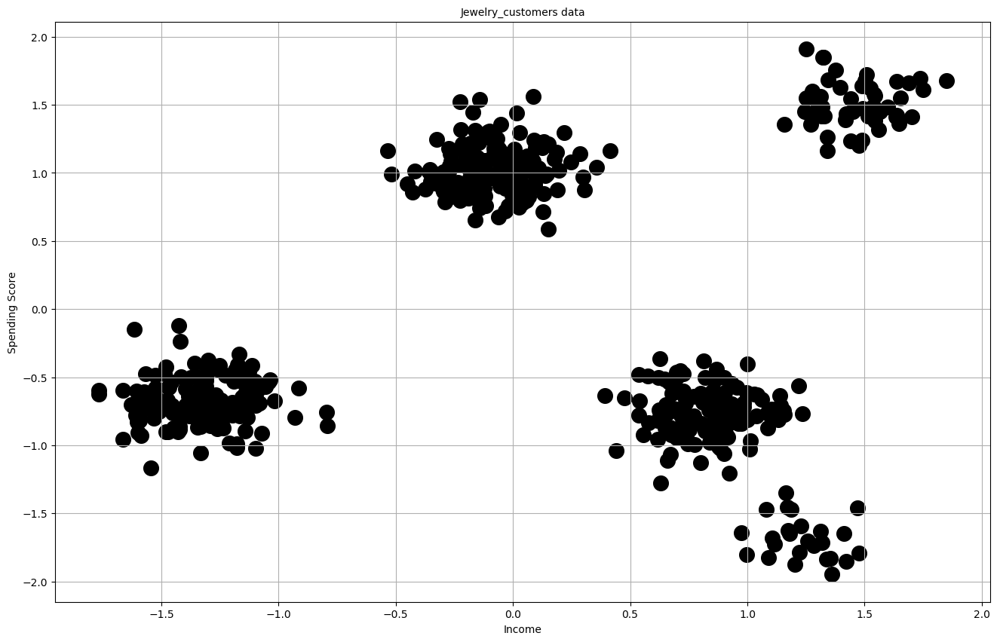

In [8]:
plt.style.use('default');

plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(data.iloc[:, 1], data.iloc[:, 2], c="black", s=200);
plt.title("Jewelry_customers data", fontsize=10);
plt.xlabel('Income', fontsize=10);
plt.ylabel('Spending Score', fontsize=10);
plt.xticks(fontsize=10);
plt.yticks(fontsize=10);

## K-means

### Using the elbow method to find the optimal number of clusters

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=1, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=6, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=7, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=9, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

Text(0.5, 1.0, 'The elbow method')

Text(0.5, 0, 'The number of clusters')

Text(0, 0.5, 'WCSS')

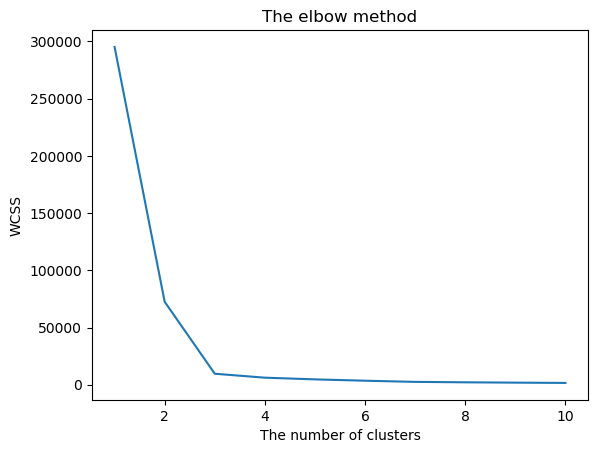

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=6, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=7, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=9, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

{2: 0.679582522159578,
 3: 0.8183004930161499,
 4: 0.7348275039538985,
 5: 0.6217022006363858,
 6: 0.5347728512821067,
 7: 0.5329372359204687,
 8: 0.5215728218863651,
 9: 0.5083546829239703}

In [9]:
wcss = []
for i in range(1,11):
    k_means = KMeans(init='k-means++', n_clusters=i, n_init =10, random_state=42)
    k_means.fit(data)
    wcss.append(k_means.inertia_)    
    
plt.plot(range(1,11), wcss)
plt.title('The elbow method')
plt.xlabel('The number of clusters')
plt.ylabel('WCSS')
plt.show()

#finding silhoutte coefficient for different clusters
silhouette = {}
for i in range (2,10):
    kmeans = KMeans(n_clusters=i,init='k-means++',n_init=10,random_state=42)
    kmeans.fit(data)
    silhouette[i] = metrics.silhouette_score(data, kmeans.labels_, metric='euclidean')

silhouette

#### From elbow plot and silhoutte coefficient, k=3 gives the highest score

#### Performing k-means with k =3

In [10]:
k_means = KMeans(init='k-means++', n_clusters=3, n_init=10, random_state=42)
k_means.fit(data)
k_means.labels_
k_means.cluster_centers_

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

array([2, 2, 2, 2, 1, 0, 2, 1, 1, 1, 1, 0, 0, 0, 2, 1, 2, 1, 1, 1, 0, 1,
       2, 1, 1, 0, 0, 2, 1, 2, 2, 2, 1, 2, 0, 2, 1, 2, 0, 0, 2, 1, 0, 2,
       2, 0, 1, 0, 0, 2, 1, 0, 0, 1, 2, 1, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2,
       1, 0, 0, 2, 2, 0, 1, 1, 0, 2, 0, 2, 2, 0, 2, 1, 2, 1, 1, 0, 0, 2,
       2, 2, 2, 2, 0, 1, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 2,
       1, 0, 2, 0, 0, 0, 2, 0, 0, 1, 0, 1, 1, 1, 0, 1, 2, 1, 2, 2, 0, 2,
       0, 2, 0, 1, 1, 0, 2, 0, 1, 2, 2, 0, 2, 0, 2, 1, 2, 1, 2, 0, 1, 2,
       1, 1, 0, 2, 1, 2, 0, 1, 2, 0, 1, 0, 1, 2, 0, 2, 1, 2, 0, 2, 1, 2,
       2, 1, 1, 1, 2, 2, 0, 0, 0, 1, 0, 2, 2, 2, 0, 1, 2, 2, 2, 1, 0, 0,
       1, 1, 1, 0, 2, 0, 2, 0, 2, 1, 0, 2, 1, 1, 1, 1, 2, 1, 0, 0, 0, 1,
       2, 2, 0, 1, 0, 0, 0, 2, 2, 1, 2, 2, 1, 2, 2, 2, 0, 2, 0, 0, 0, 2,
       2, 2, 1, 2, 0, 1, 0, 0, 0, 1, 2, 0, 1, 1, 0, 0, 2, 2, 1, 2, 2, 1,
       2, 1, 0, 0, 2, 0, 1, 2, 1, 1, 0, 2, 1, 1, 2, 2, 1, 0, 0, 1, 0, 1,
       1, 0, 1, 1, 1, 0, 2, 0, 0, 2, 0, 1, 1, 0, 2,

array([[ 3.03352273e+01,  1.00728921e+00, -1.09512729e-01,
         2.17629962e-03],
       [ 8.75174419e+01, -9.52902425e-01, -8.25573295e-01,
         9.15761971e-01],
       [ 5.99554140e+01, -8.52463930e-02,  1.02721559e+00,
        -1.00569483e+00]])

### Let's see how many are in each cluster

In [11]:
new = pd.DataFrame()
new['cluster'] = k_means.fit_predict(data)
new.cluster.value_counts()

0    176
1    172
2    157
Name: cluster, dtype: int64

### Plotting the clusters

<Figure size 1000x1000 with 0 Axes>

Text(0.5, 1.0, 'K-Means (K=3)')

Text(0.5, 0, 'Income')

Text(0, 0.5, 'Spending Score')

(array([-2. , -1.5, -1. , -0.5,  0. ,  0.5,  1. ,  1.5,  2. ,  2.5]),
 <a list of 10 Text xticklabel objects>)

(array([-2.5, -2. , -1.5, -1. , -0.5,  0. ,  0.5,  1. ,  1.5,  2. ,  2.5]),
 <a list of 11 Text yticklabel objects>)

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(59.95541401273885, -0.08524639295632358, '2')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(30.335227272727295, 1.0072892087899765, '0')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

Text(87.51744186046514, -0.9529024247261225, '1')

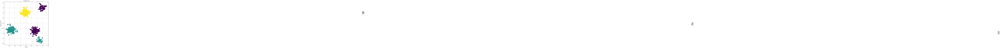

In [12]:
plt.style.use('default');

plt.figure(figsize=(10, 10));
plt.grid(True);

sc = plt.scatter(data.iloc[:, 1], data.iloc[:, 2], s=200, c=k_means.labels_);
#plt.scatter(k_means.cluster_centers_[:, 1], k_means.cluster_centers_[:, 2], marker='x', s=500, c="black")
plt.title("K-Means (K=3)", fontsize=10);
plt.xlabel('Income', fontsize=10);
plt.ylabel('Spending Score', fontsize=10);
plt.xticks(fontsize=10);
plt.yticks(fontsize=10);

for label in k_means.labels_:
    plt.text(x=k_means.cluster_centers_[label, 0], y=k_means.cluster_centers_[label, 1], s=label, fontsize=32, 
             horizontalalignment='center', verticalalignment='center', color='black',
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.1', alpha=0.02));


## Internal Validation Metrics

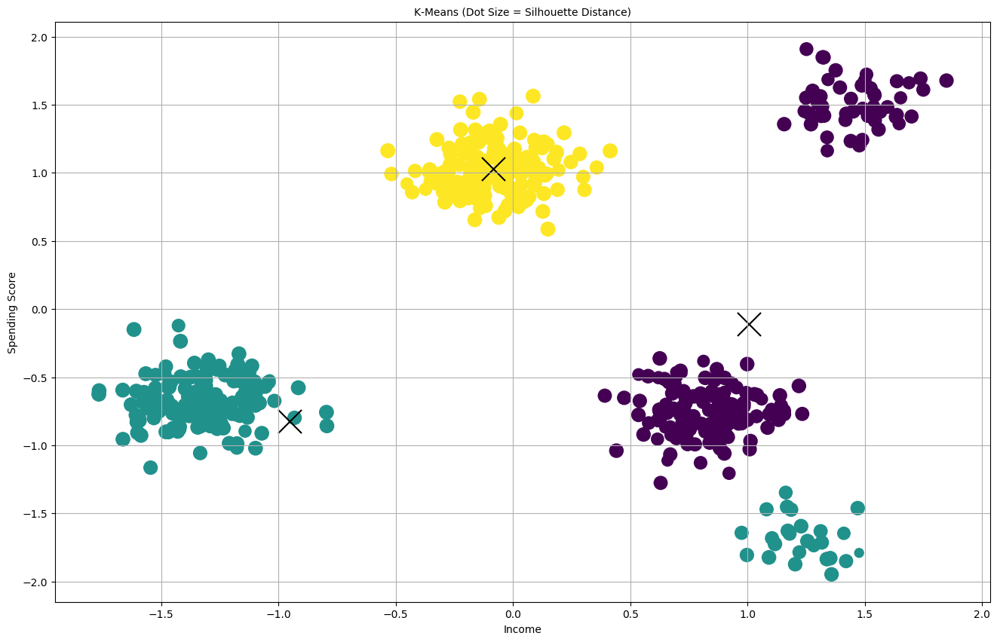

In [13]:
# WCSS == Inertia
    
k_means.inertia_
silhouette_score(data, k_means.labels_)

plt.style.use('default');

sample_silhouette_values = silhouette_samples(data, k_means.labels_)
sizes = 200*sample_silhouette_values

plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(data.iloc[:, 1], data.iloc[:, 2], s=sizes, c=k_means.labels_)
plt.scatter(k_means.cluster_centers_[:, 1], k_means.cluster_centers_[:, 2], marker='x', s=500, c="black")

plt.title("K-Means (Dot Size = Silhouette Distance)", fontsize=10);
plt.xlabel('Income', fontsize=10);
plt.ylabel('Spending Score', fontsize=10);
plt.xticks(fontsize=10);
plt.yticks(fontsize=10);

## Elbow Method (Manual)

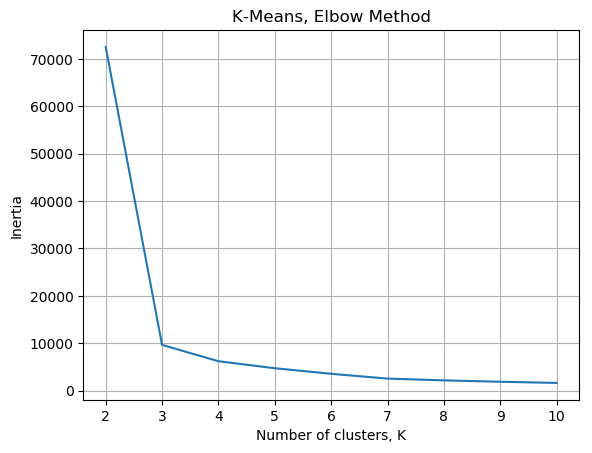

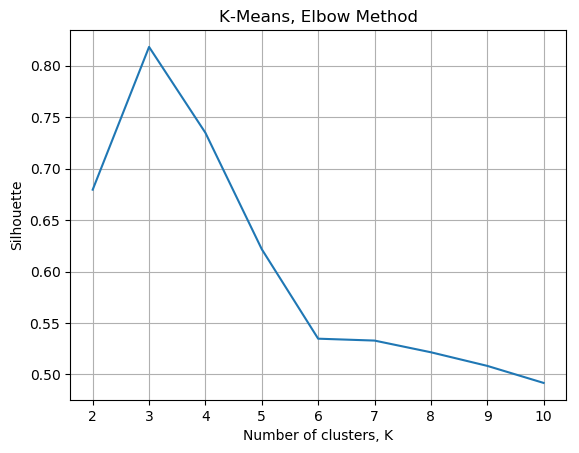

In [14]:
inertias = {}
silhouettes = {}
for k in range(2, 11):
    kmeans = KMeans(init='k-means++', n_init=10, n_clusters=k, max_iter=1000, random_state=42).fit(data)
    inertias[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
    silhouettes[k] = silhouette_score(data, kmeans.labels_, metric='euclidean')
    

plt.figure();
plt.grid(True);
plt.plot(list(inertias.keys()), list(inertias.values()));
plt.title('K-Means, Elbow Method')
plt.xlabel("Number of clusters, K");
plt.ylabel("Inertia");


plt.figure();
plt.grid(True);
plt.plot(list(silhouettes.keys()), list(silhouettes.values()));
plt.title('K-Means, Elbow Method')
plt.xlabel("Number of clusters, K");
plt.ylabel("Silhouette");


## Intepreting the Clusters

In [15]:
k_means.cluster_centers_

for label in set(k_means.labels_):
    print('\nCluster {}:'.format(label))
    data_tmp = data[k_means.labels_==label].copy()
    data_tmp.loc['mean'] = data_tmp.mean()
    data_tmp.tail(13)

array([[ 3.03352273e+01,  1.00728921e+00, -1.09512729e-01,
         2.17629962e-03],
       [ 8.75174419e+01, -9.52902425e-01, -8.25573295e-01,
         9.15761971e-01],
       [ 5.99554140e+01, -8.52463930e-02,  1.02721559e+00,
        -1.00569483e+00]])


Cluster 0:


,Age,Income,SpendingScore,Savings
463,28.000000,0.535322,-0.776811,0.705873
466,18.000000,1.340611,1.162288,-1.505162
468,32.000000,1.155169,-0.746896,0.495131
471,31.000000,0.714618,-0.774009,1.022407
476,33.000000,0.868912,-0.951075,0.519625
477,33.000000,0.878451,-0.627070,0.613434
482,32.000000,0.915078,-0.839366,0.977675
487,26.000000,1.320782,1.848446,-1.515115
496,22.000000,1.597305,1.483239,-1.824853
498,30.000000,0.626207,-0.362296,0.900909



Cluster 1:


,Age,Income,SpendingScore,Savings
485,90.000000,-1.466499,-0.573590,0.821470
486,91.000000,-1.316793,-0.776438,1.132151
488,92.000000,-1.579355,-0.683255,0.703620
489,97.000000,-1.341656,-0.852659,0.620046
490,84.000000,-1.086019,-0.583946,0.950770
493,92.000000,-1.098006,-0.648148,1.109584
494,87.000000,-1.268291,-0.628164,1.270098
497,91.000000,-1.244736,-0.776418,0.734084
501,93.000000,-1.545704,-1.164109,1.235201
502,90.000000,-1.118447,-0.578054,0.855313



Cluster 2:


,Age,Income,SpendingScore,Savings
467,61.000000,-0.096957,0.991771,-0.998383
469,63.000000,-0.137199,1.007903,-0.930429
470,58.000000,-0.134529,0.998339,-0.849062
472,62.000000,-0.051124,1.123989,-1.450915
473,60.000000,-0.334767,0.951579,-0.873509
474,62.000000,-0.216432,1.210931,-1.194480
478,65.000000,-0.141370,0.739895,-0.989273
479,59.000000,-0.169793,1.445093,-1.086232
480,65.000000,-0.119150,1.090334,-0.574015
491,58.000000,-0.143067,1.539992,-0.890089


## Finding Examplars

In [16]:
from scipy.spatial import distance

for i, label in enumerate(set(k_means.labels_)):    
    data_tmp = data[k_means.labels_==label].copy()
    
    exemplar_idx = distance.cdist([k_means.cluster_centers_[i]], data_tmp).argmin()
    exemplar = pd.DataFrame(data_tmp.iloc[exemplar_idx])
   
    print('\nCluster {}:'.format(label))
    exemplar


Cluster 0:


,12
Age,30.000000
Income,0.679576
SpendingScore,-0.618419
Savings,0.355798



Cluster 1:


,123
Age,88.000000
Income,-1.154490
SpendingScore,-0.645831
Savings,0.741957



Cluster 2:


,40
Age,60.000000
Income,-0.152995
SpendingScore,1.115669
Savings,-0.930200


## Snake Plots

Text(0.5, 1.0, 'Snake Plot, K-Means, K=3')

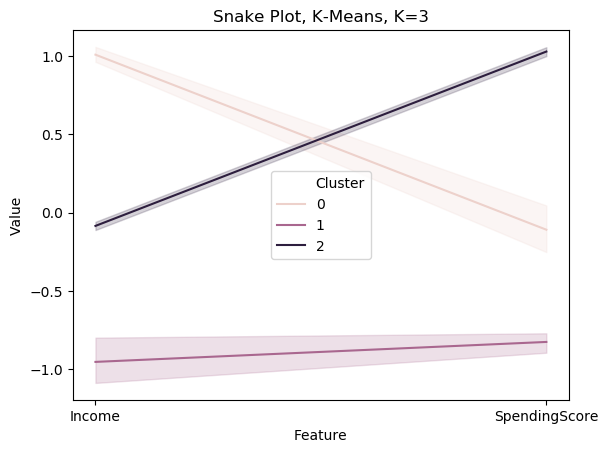

In [28]:
dat = data.copy()
dat['Cluster'] = k_means.labels_

datamart_melt = pd.melt(dat.reset_index(),
id_vars=['Cluster'],
value_vars=['Income','SpendingScore'],
var_name='Feature',
value_name='Value')

plt.title('Snake Plot, K-Means, K=3')
sns.lineplot(x="Feature", y="Value", hue='Cluster', data=datamart_melt)


## Relative Importance Plots

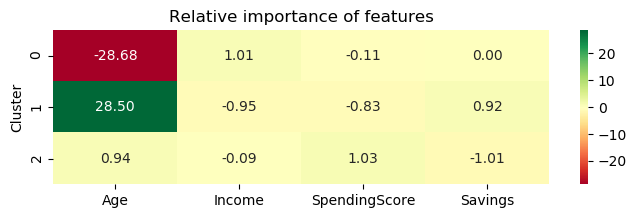

In [18]:
cluster_avg = dat.groupby(['Cluster']).mean()
population_avg = dat.drop(['Cluster'], axis=1).mean()

relative_imp = cluster_avg - population_avg

plt.figure(figsize=(8, 2));
plt.title('Relative importance of features');
sns.heatmap(data=relative_imp, annot=True, fmt='.2f', cmap='RdYlGn');

## Experimenting with Lots of Ks

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

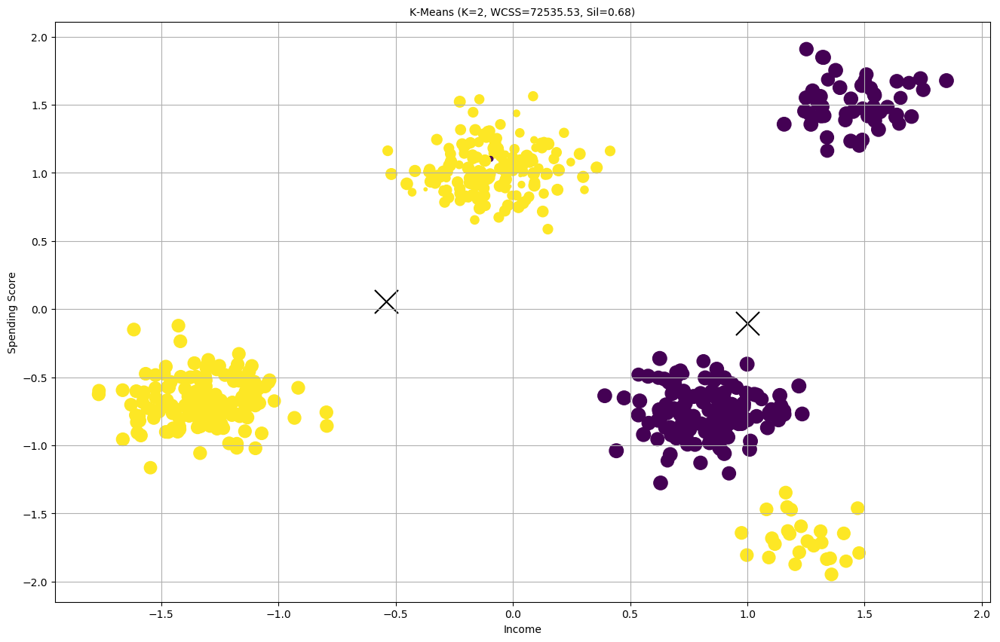

K=2, WCSS=72535.53, Sil=0.68


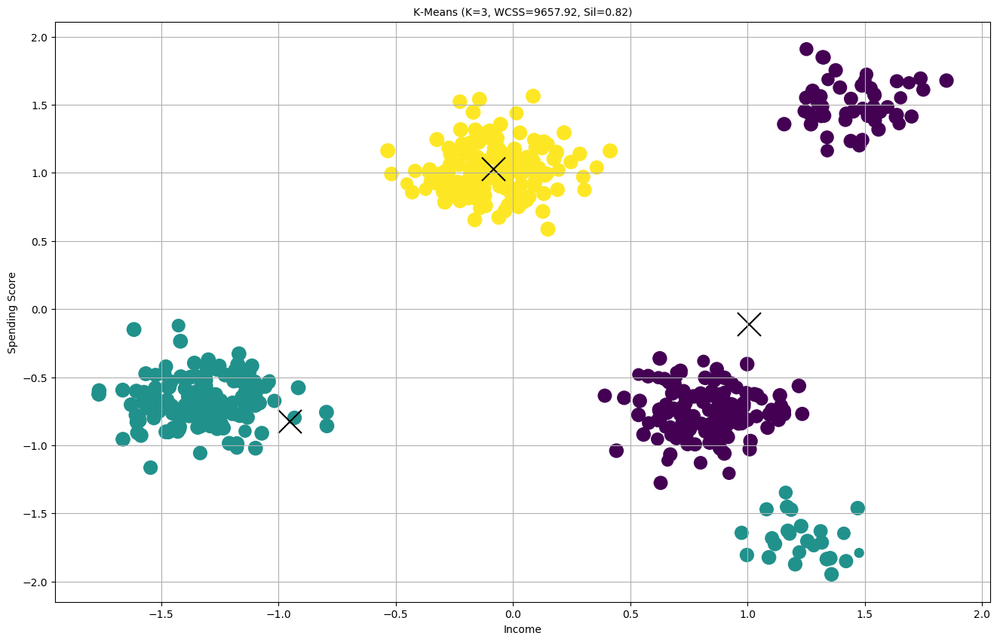

K=3, WCSS=9657.92, Sil=0.82


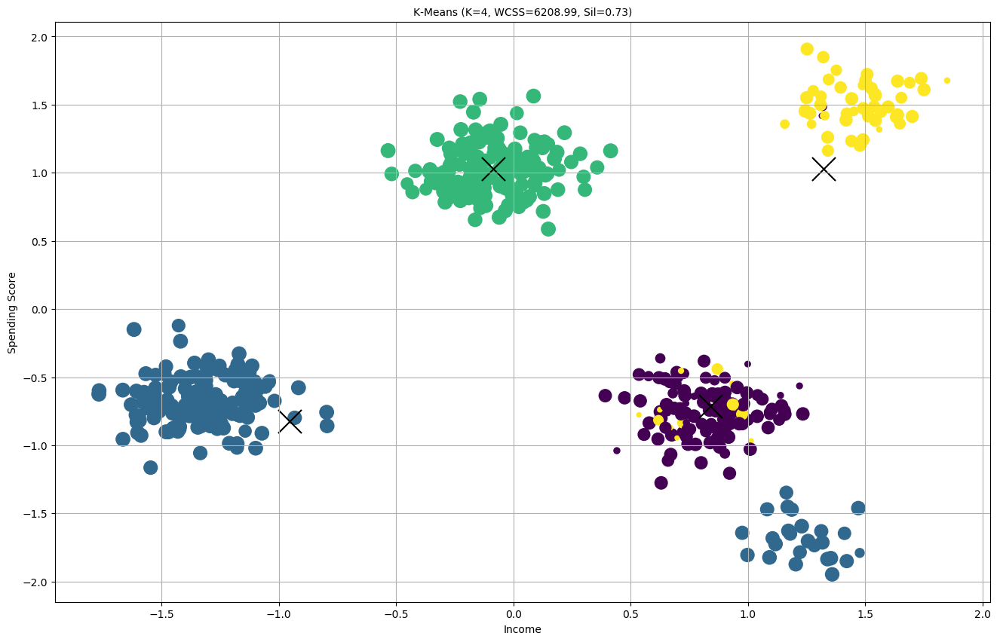

K=4, WCSS=6208.99, Sil=0.73


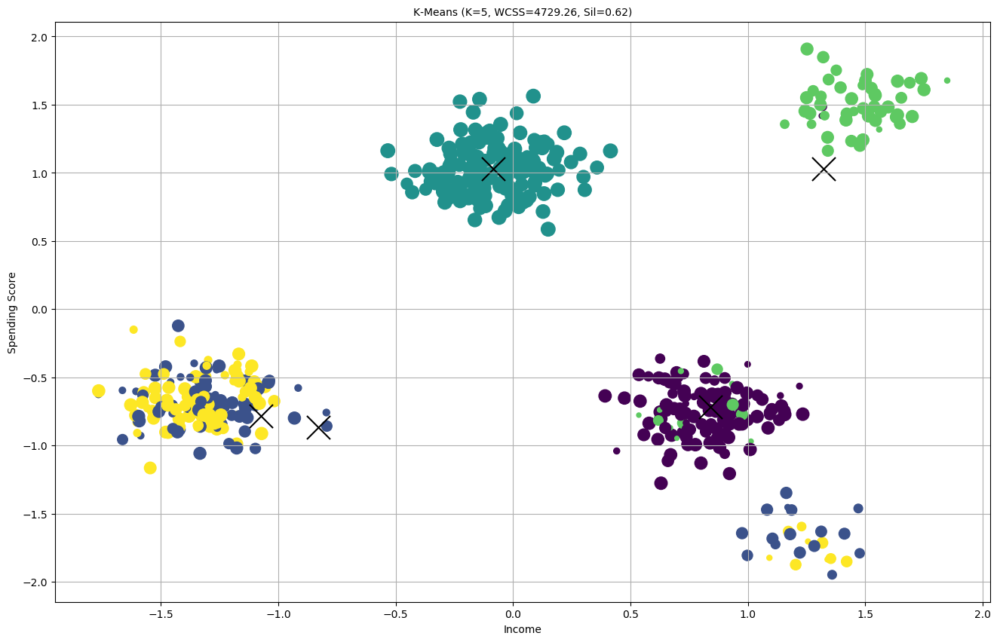

K=5, WCSS=4729.26, Sil=0.62


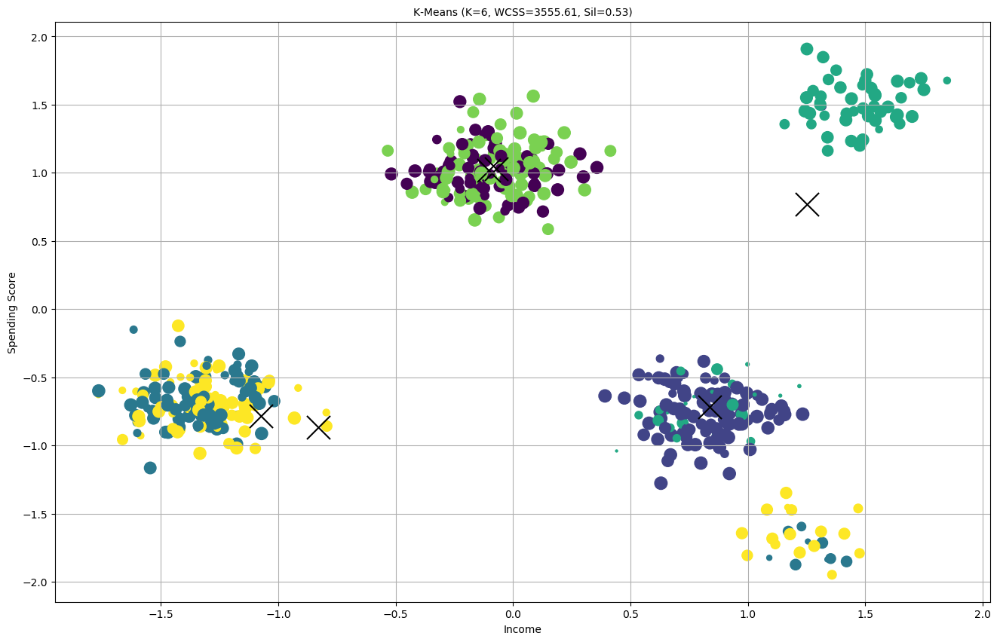

K=6, WCSS=3555.61, Sil=0.53


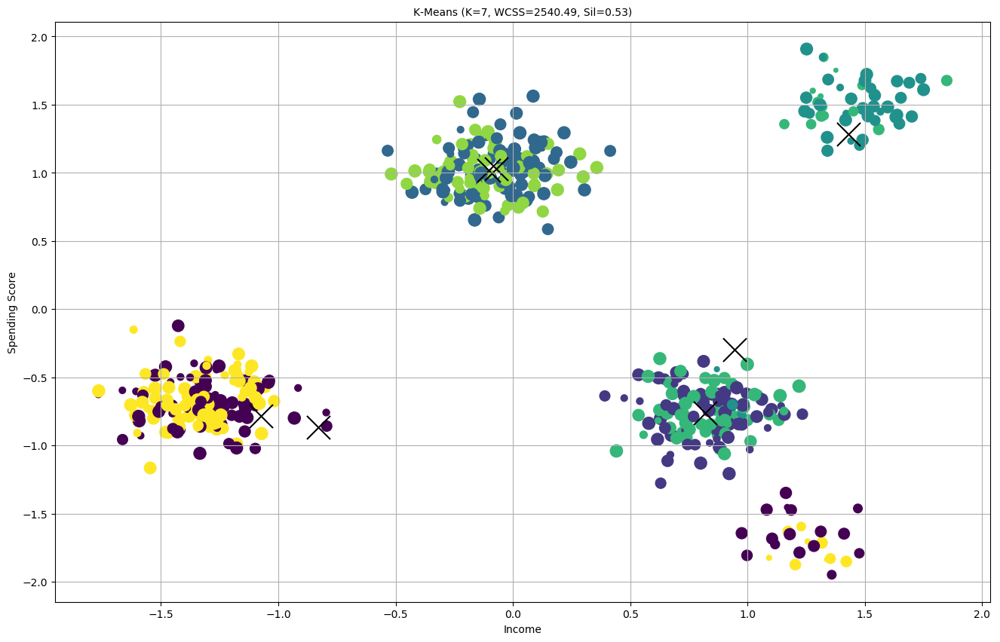

K=7, WCSS=2540.49, Sil=0.53


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


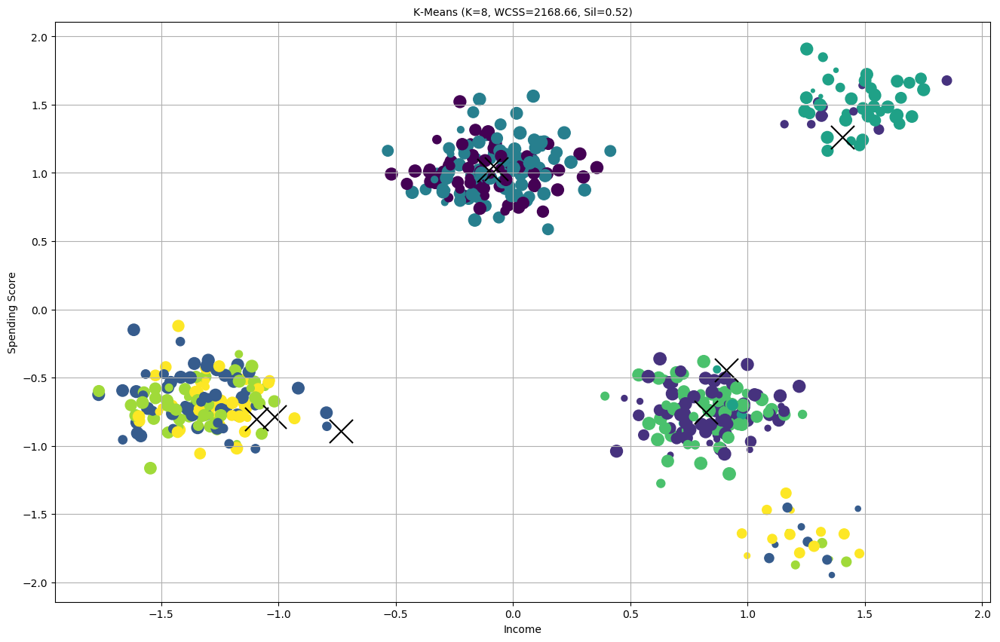

K=8, WCSS=2168.66, Sil=0.52


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


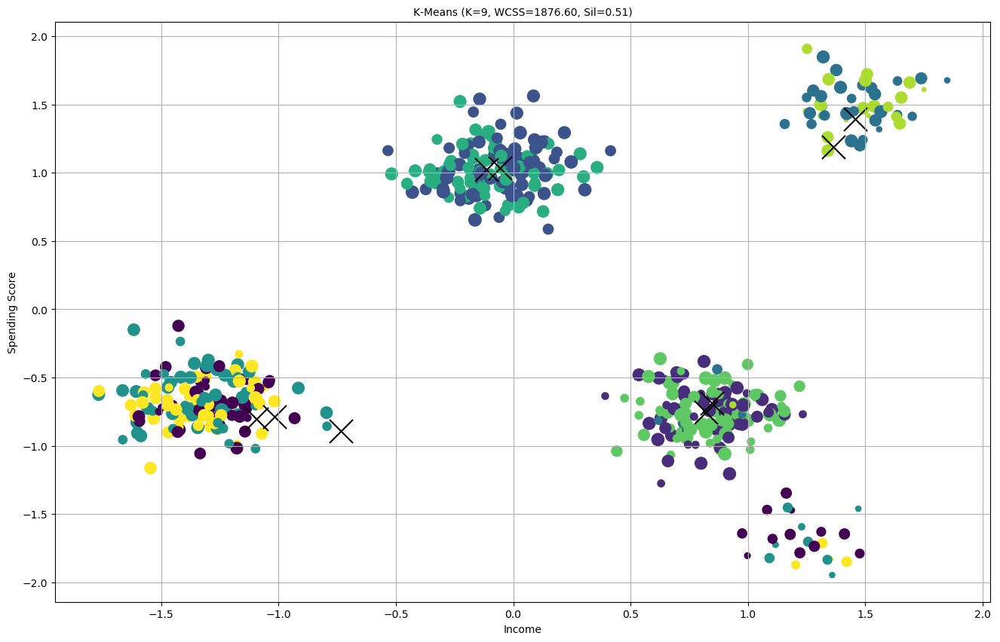

K=9, WCSS=1876.60, Sil=0.51


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


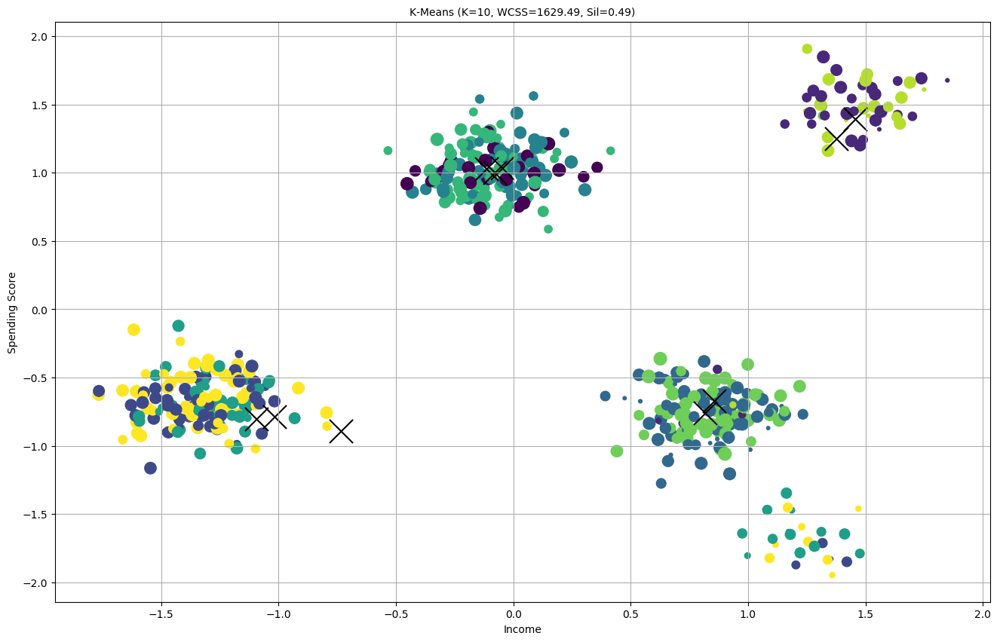

K=10, WCSS=1629.49, Sil=0.49


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


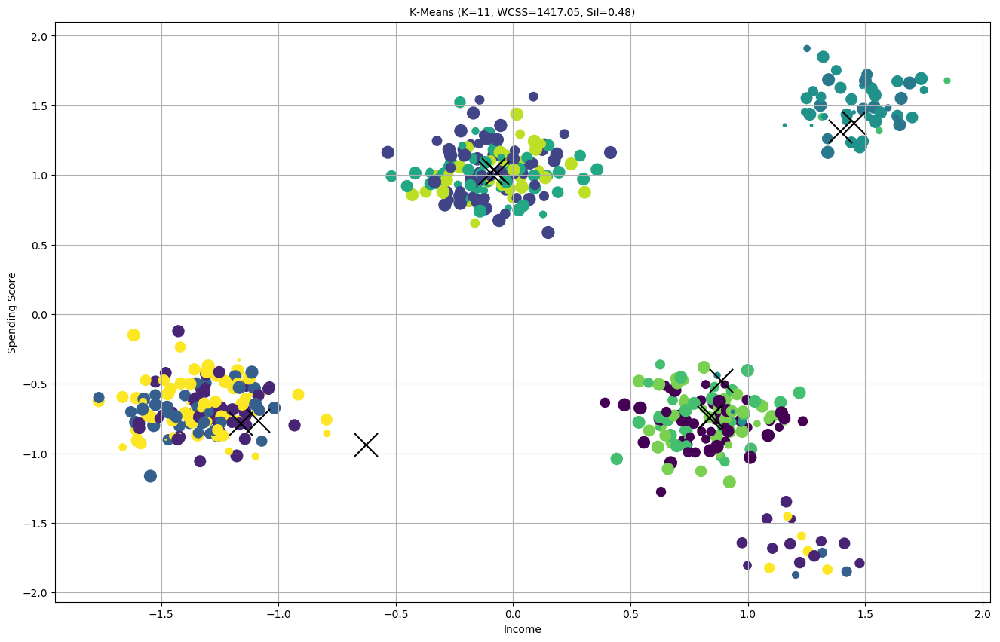

K=11, WCSS=1417.05, Sil=0.48


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


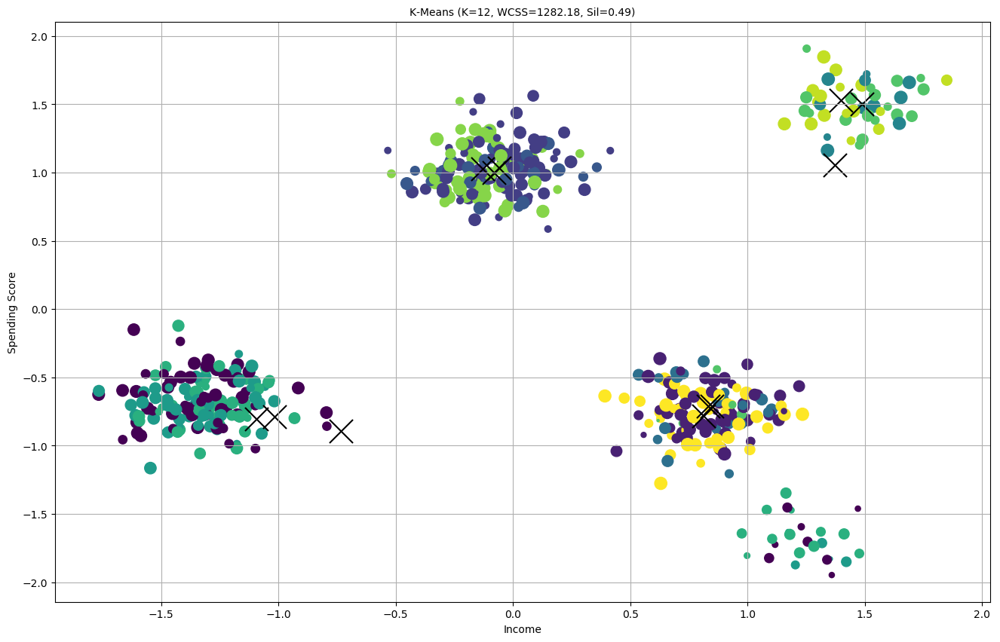

K=12, WCSS=1282.18, Sil=0.49


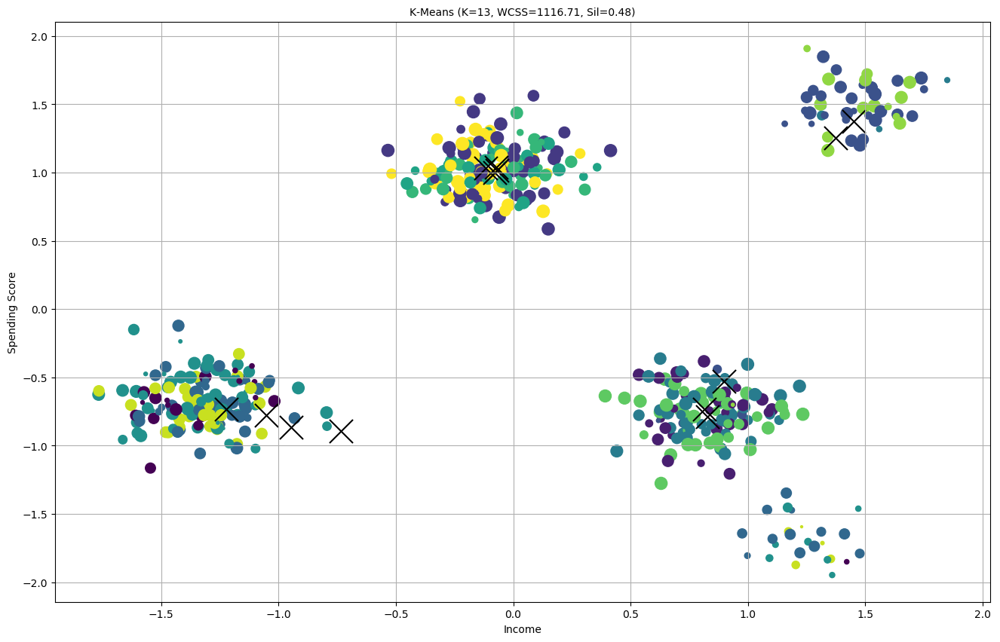

K=13, WCSS=1116.71, Sil=0.48


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


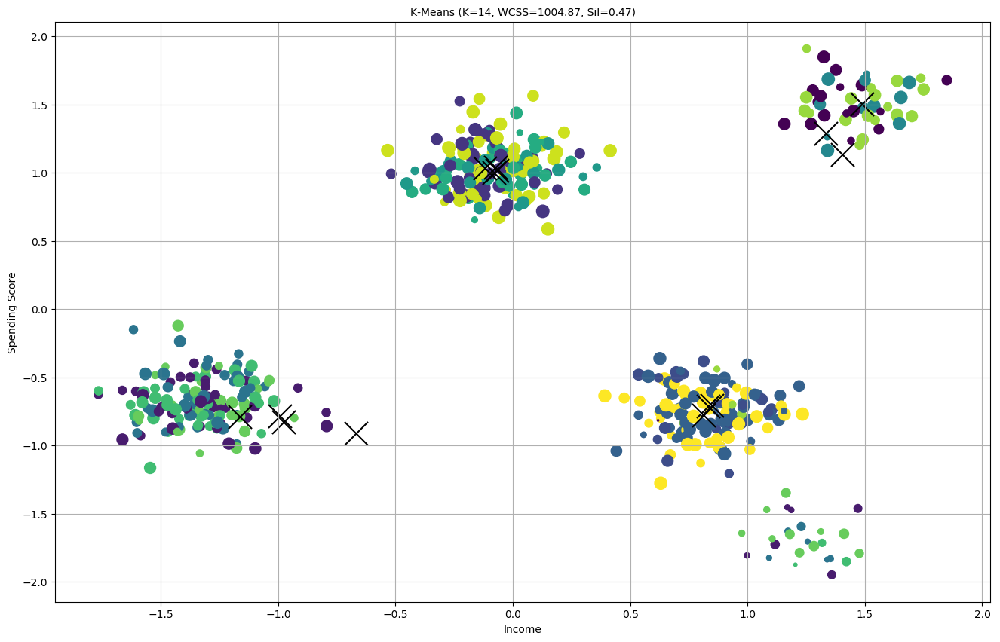

K=14, WCSS=1004.87, Sil=0.47


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


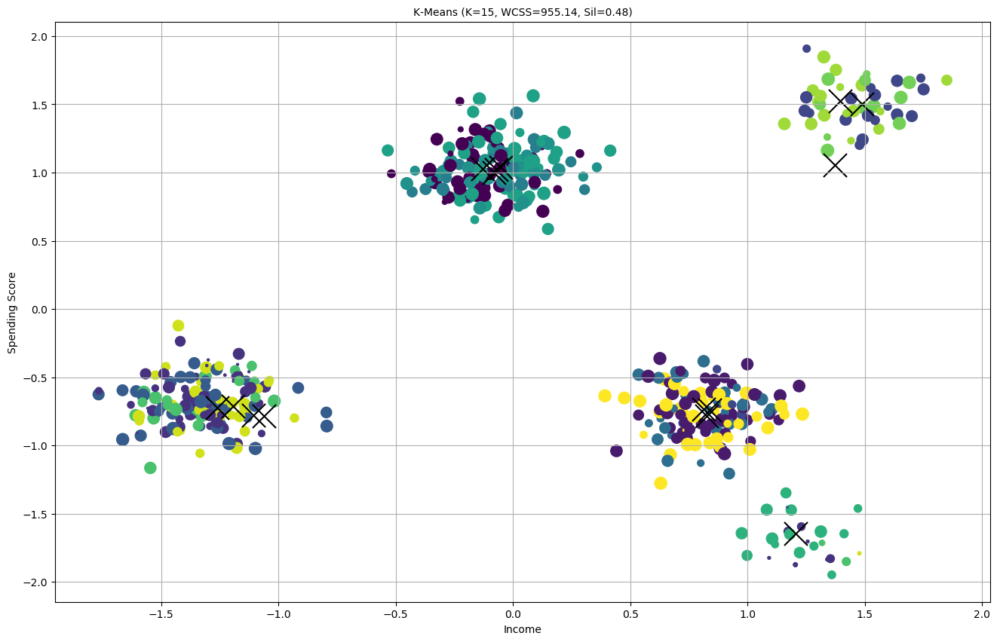

K=15, WCSS=955.14, Sil=0.48


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


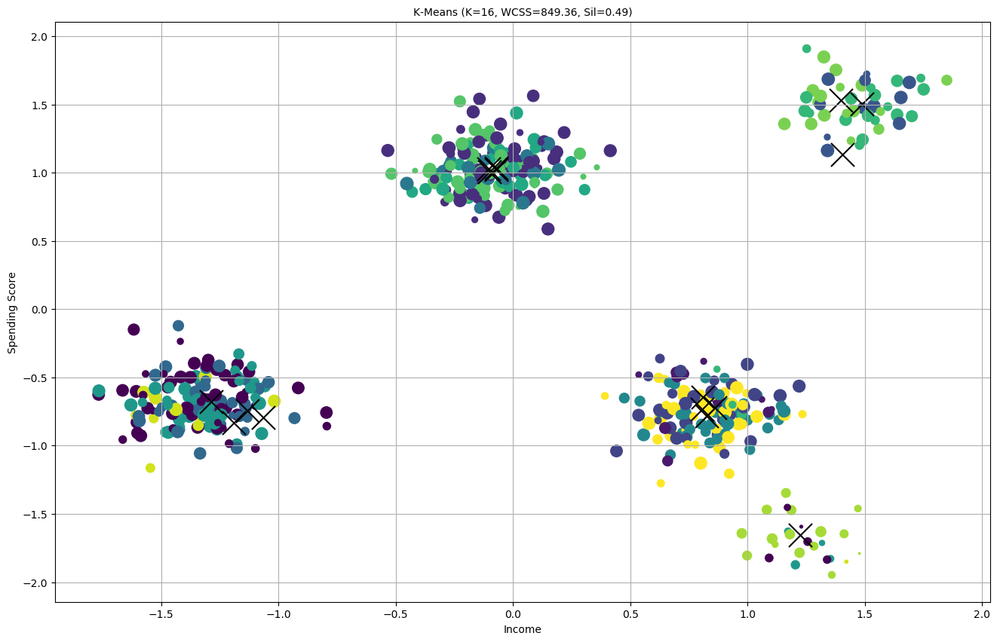

K=16, WCSS=849.36, Sil=0.49


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


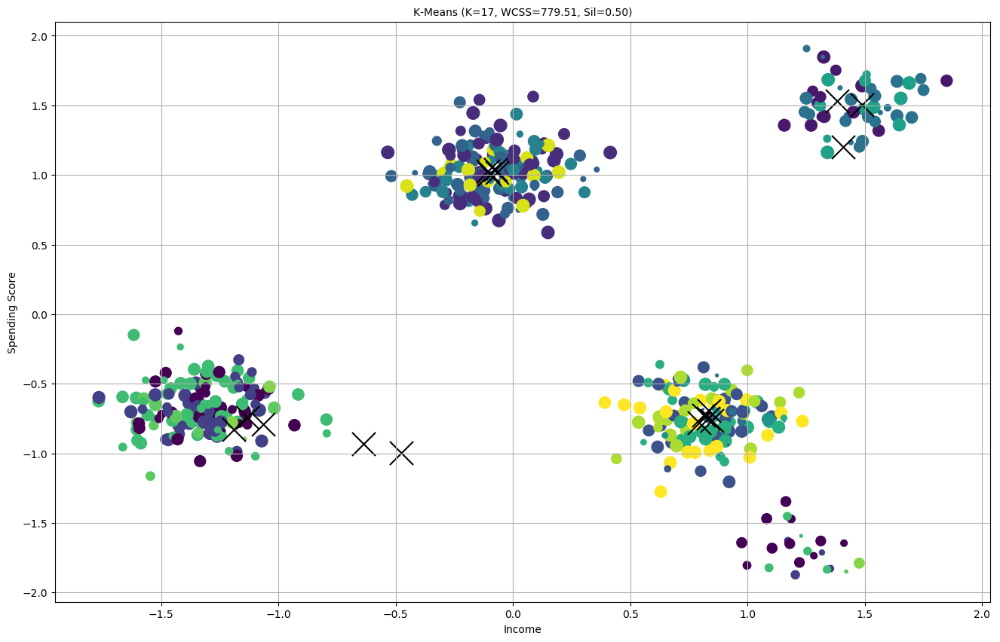

K=17, WCSS=779.51, Sil=0.50


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


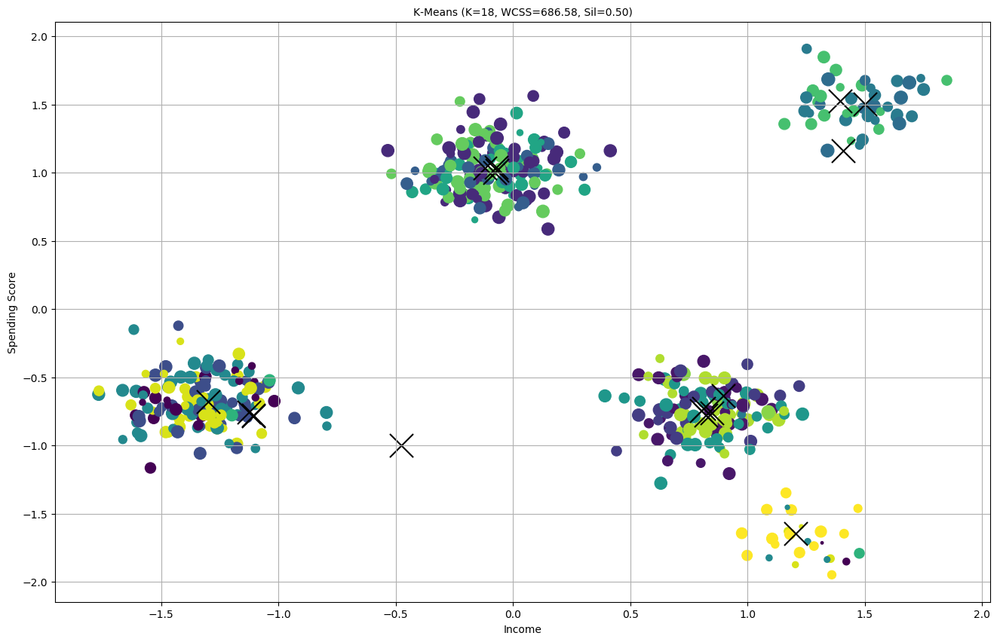

K=18, WCSS=686.58, Sil=0.50


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


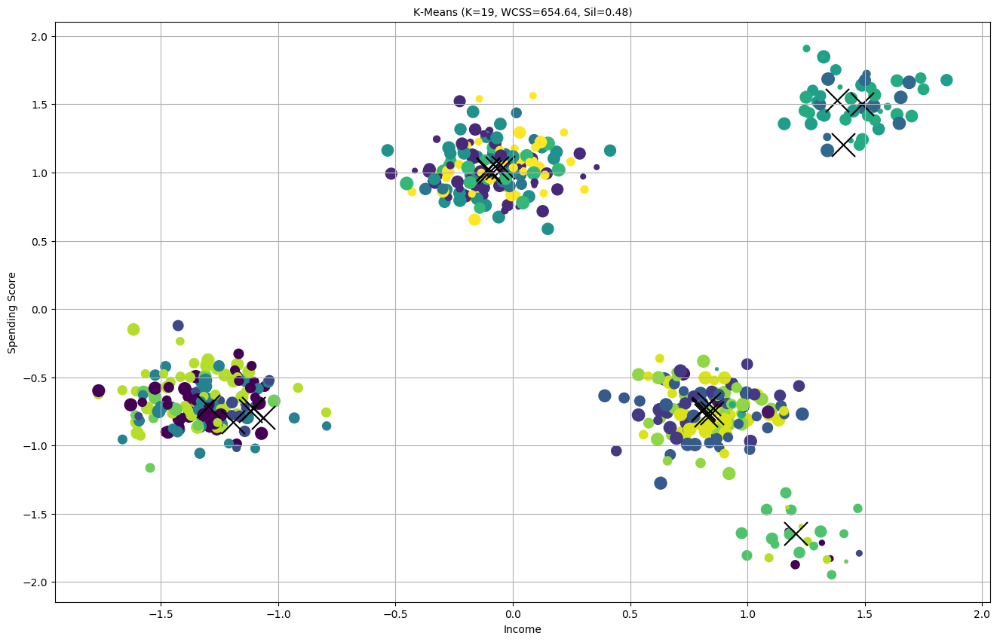

K=19, WCSS=654.64, Sil=0.48


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


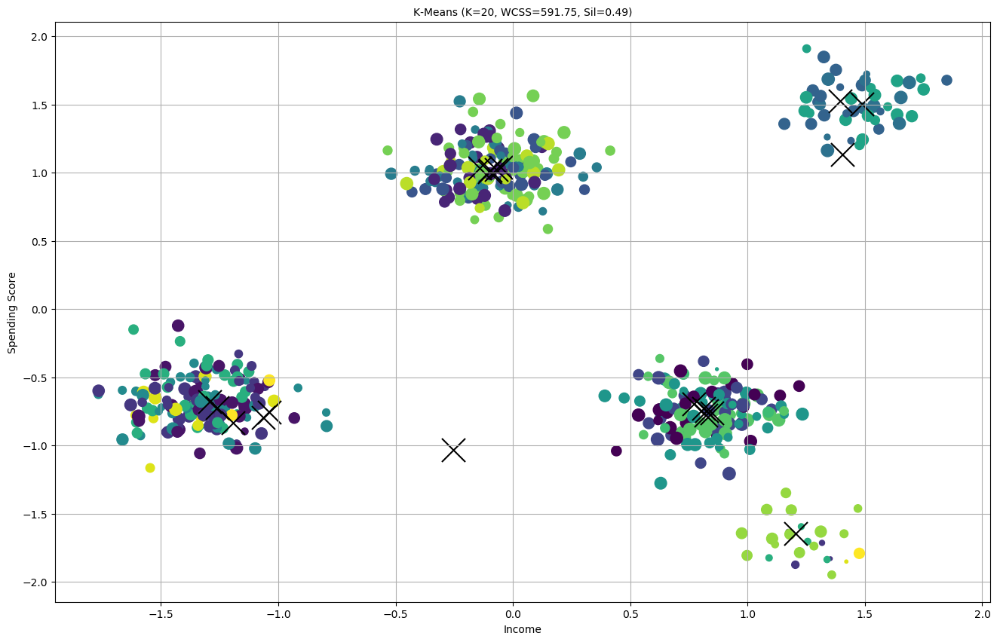

K=20, WCSS=591.75, Sil=0.49


In [19]:
k_means = KMeans(init='k-means++', n_clusters=3, n_init=10, random_state=42)
k_means.fit(data)

distances = k_means.fit_transform(data)
variance = 0
i = 0

for label in k_means.labels_:
    variance = variance + distances[i][label]
    i = i + 1
    
def do_kmeans(data, k):
    k_means = KMeans(init='k-means++', n_clusters=k, n_init=10, random_state=42)
    k_means.fit(data)
    wcss = k_means.inertia_
    sil = silhouette_score(data, k_means.labels_)
    
    plt.style.use('default');

    sample_silhouette_values = silhouette_samples(data, k_means.labels_)
    sizes = 200*sample_silhouette_values

    plt.figure(figsize=(16, 10));
    plt.grid(True);

    plt.scatter(data.iloc[:, 1], data.iloc[:, 2], s=sizes, c=k_means.labels_)
    plt.scatter(k_means.cluster_centers_[:, 1], k_means.cluster_centers_[:, 2], marker='x', s=500, c="black")

    plt.title("K-Means (K={}, WCSS={:.2f}, Sil={:.2f})".format(k, wcss, sil), fontsize=10);
    plt.xlabel('Income', fontsize=10);
    plt.ylabel('Spending Score', fontsize=10);
    plt.xticks(fontsize=10);
    plt.yticks(fontsize=10);
    plt.show()
    
    print("K={}, WCSS={:.2f}, Sil={:.2f}".format(k, wcss, sil))

for k in range(2, 21):
    do_kmeans(data, k)

# DBSCAN Method

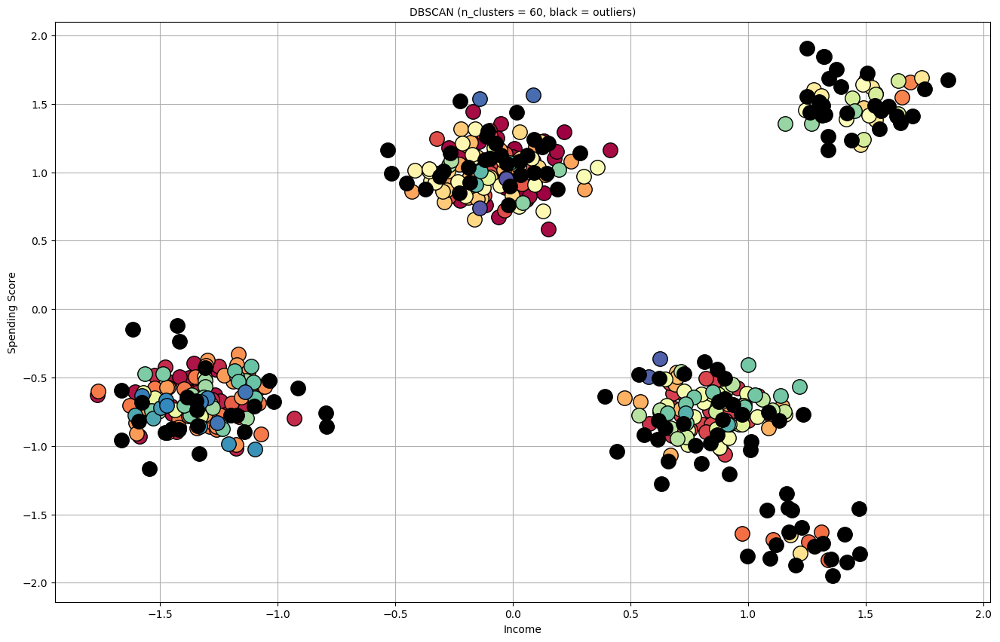

In [20]:
#==========DBSCAN=====================================================

db = DBSCAN(eps=0.3, min_samples=2)
db.fit(data)

db.labels_
silhouette_score(data, db.labels_)

plt.figure(figsize=(16, 10));
plt.grid(True);

unique_labels = set(db.labels_)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))];

for k in unique_labels:
    if k == -1:        # Black used for noise.
        col = [0, 0, 0, 1]
    else:
        col = colors[k]

    xy = data[db.labels_ == k]
    plt.plot(xy.iloc[:, 1], xy.iloc[:, 2], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=14);

    
plt.title('');
plt.title("DBSCAN (n_clusters = {:d}, black = outliers)".format(len(unique_labels)), fontsize=10);
plt.xlabel('Income', fontsize=10);
plt.ylabel('Spending Score', fontsize=10);
plt.xticks(fontsize=10);
plt.yticks(fontsize=10);

## Elbow Method

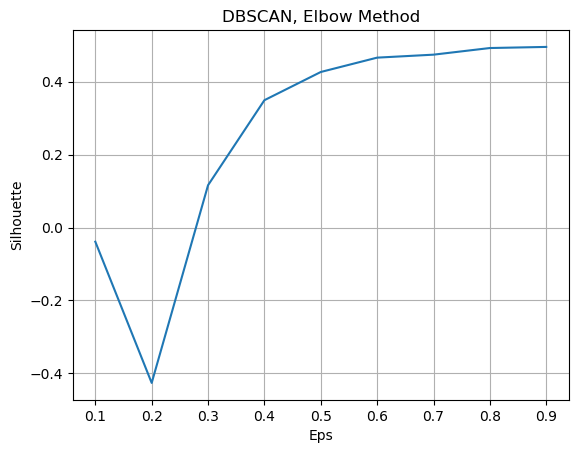

In [31]:
silhouettes = {}
for eps in np.arange(0.1, 1, 0.1):
    db = DBSCAN(eps=eps, min_samples=3).fit(data)
    silhouettes[eps] = silhouette_score(data, db.labels_, metric='euclidean')
    

plt.figure();
plt.plot(list(silhouettes.keys()), list(silhouettes.values()));
plt.title('DBSCAN, Elbow Method')
plt.xlabel("Eps");
plt.ylabel("Silhouette");
plt.grid(True);

##### We can see that the Silhouette Score is high for eps = 0.9 but not as high compared to K-means with k =3

### More Parameter Exploration

eps=0.1, min_samples=1, n_clusters=478, sil=0.055797460440862034
eps=0.1, min_samples=2, n_clusters=26, sil=-0.7558184475166694
eps=0.1, min_samples=3, n_clusters=2, sil=-0.03906794657218648
eps=0.1, min_samples=4, n_clusters <= 1. Returning.
eps=0.1, min_samples=5, n_clusters <= 1. Returning.
eps=0.1, min_samples=6, n_clusters <= 1. Returning.
eps=0.1, min_samples=7, n_clusters <= 1. Returning.
eps=0.1, min_samples=8, n_clusters <= 1. Returning.
eps=0.1, min_samples=9, n_clusters <= 1. Returning.
eps=0.2, min_samples=1, n_clusters=339, sil=0.1425726820906544
eps=0.2, min_samples=2, n_clusters=70, sil=-0.2614562328134808
eps=0.2, min_samples=3, n_clusters=32, sil=-0.4260215548654892
eps=0.2, min_samples=4, n_clusters=17, sil=-0.5808710967856759
eps=0.2, min_samples=5, n_clusters=10, sil=-0.721741169003254
eps=0.2, min_samples=6, n_clusters=3, sil=-0.5027636498634737
eps=0.2, min_samples=7, n_clusters=2, sil=-0.017345512684178357
eps=0.2, min_samples=8, n_clusters=2, sil=-0.021695994281

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.4, min_samples=2, n_clusters=59, sil=0.4216939446792098


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.4, min_samples=3, n_clusters=47, sil=0.3490691458352258


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.4, min_samples=4, n_clusters=38, sil=0.2563957000178881


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.4, min_samples=5, n_clusters=32, sil=0.16296611091455418


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.4, min_samples=6, n_clusters=28, sil=0.09536199547596126


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.4, min_samples=7, n_clusters=25, sil=0.026613950491116582


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.4, min_samples=8, n_clusters=22, sil=-0.06851496638889312
eps=0.4, min_samples=9, n_clusters=19, sil=-0.15042213089184187


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=1, n_clusters=95, sil=0.5593934104919929


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=2, n_clusters=61, sil=0.5073116845710902


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=3, n_clusters=48, sil=0.4263670187749919


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=4, n_clusters=41, sil=0.35923649838535804


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=5, n_clusters=37, sil=0.3045220969009069


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=6, n_clusters=34, sil=0.25259057129527285


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=7, n_clusters=32, sil=0.2100496155992588


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=8, n_clusters=26, sil=0.08142678314614016
eps=0.5, min_samples=9, n_clusters=24, sil=0.023498444075908776

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)



eps=0.6, min_samples=1, n_clusters=87, sil=0.5717235856614751

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)



eps=0.6, min_samples=2, n_clusters=61, sil=0.5287380463627908


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.6, min_samples=3, n_clusters=51, sil=0.4657021247764743


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.6, min_samples=4, n_clusters=43, sil=0.3941369018821548


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.6, min_samples=5, n_clusters=39, sil=0.34599506136769265


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.6, min_samples=6, n_clusters=35, sil=0.28696156140989487


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.6, min_samples=7, n_clusters=33, sil=0.2507861505768022


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.6, min_samples=8, n_clusters=29, sil=0.16913276522396797


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.6, min_samples=9, n_clusters=26, sil=0.09361124606064787


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


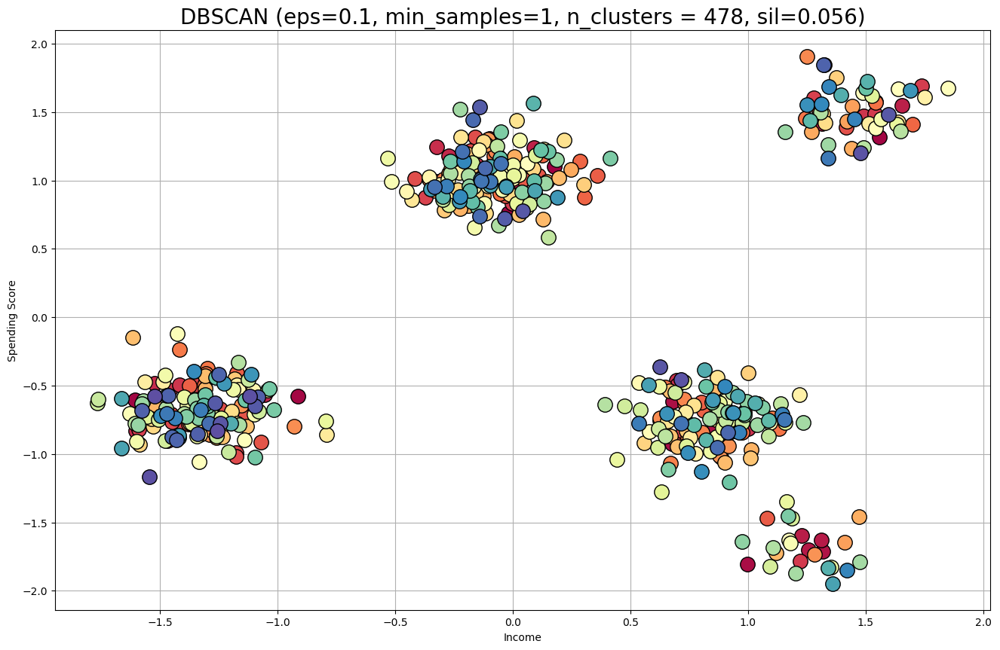

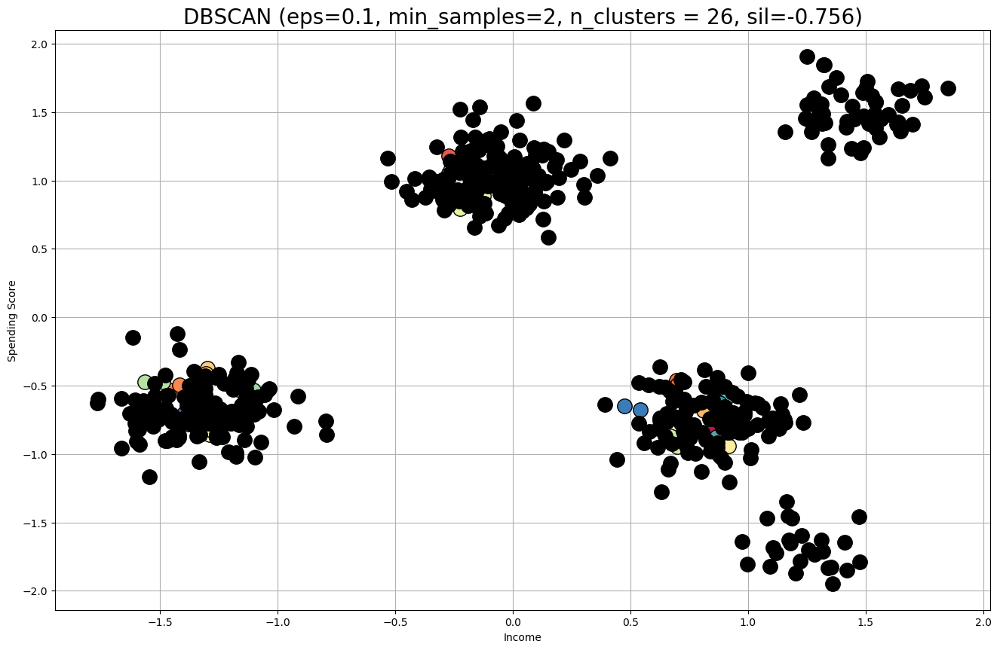

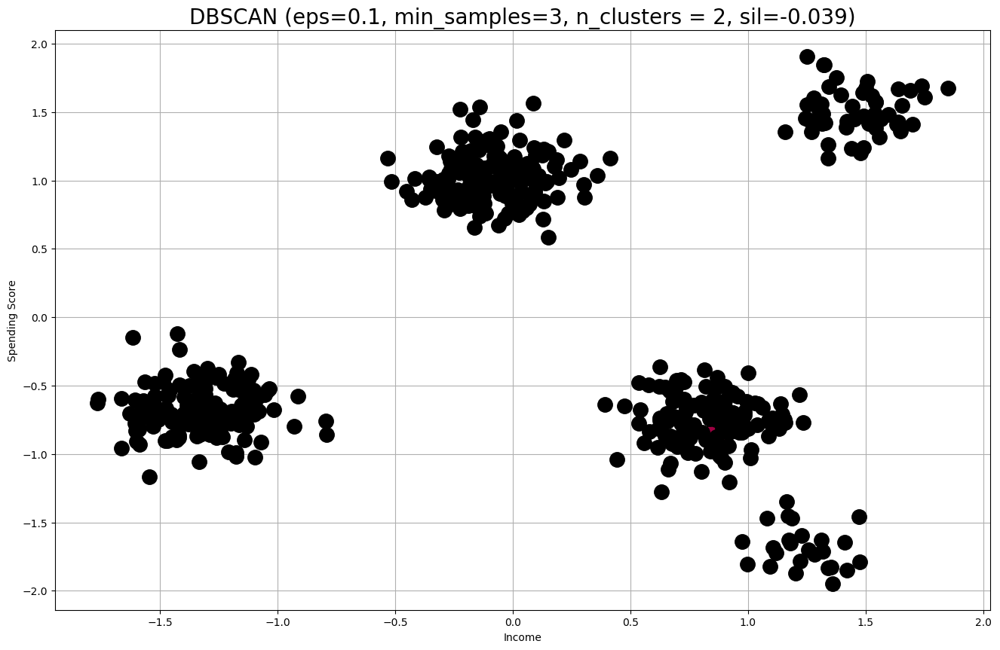

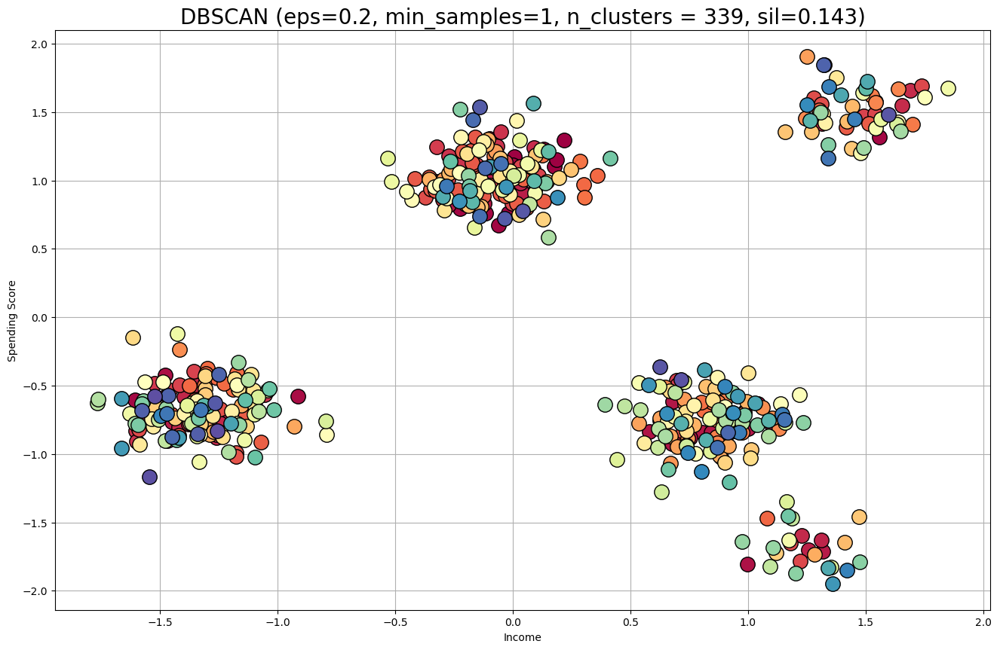

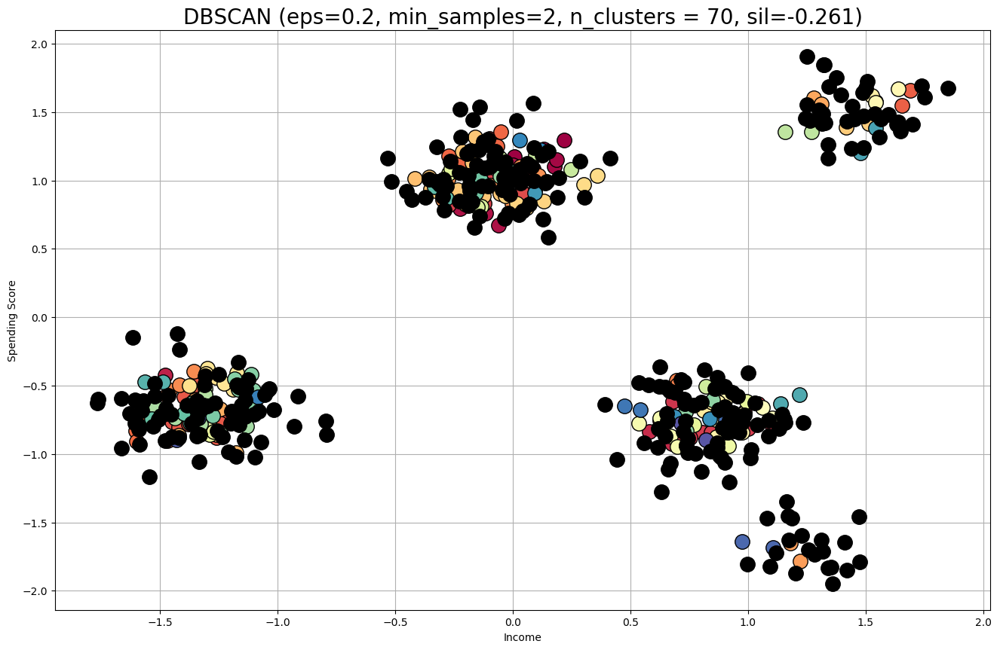

...

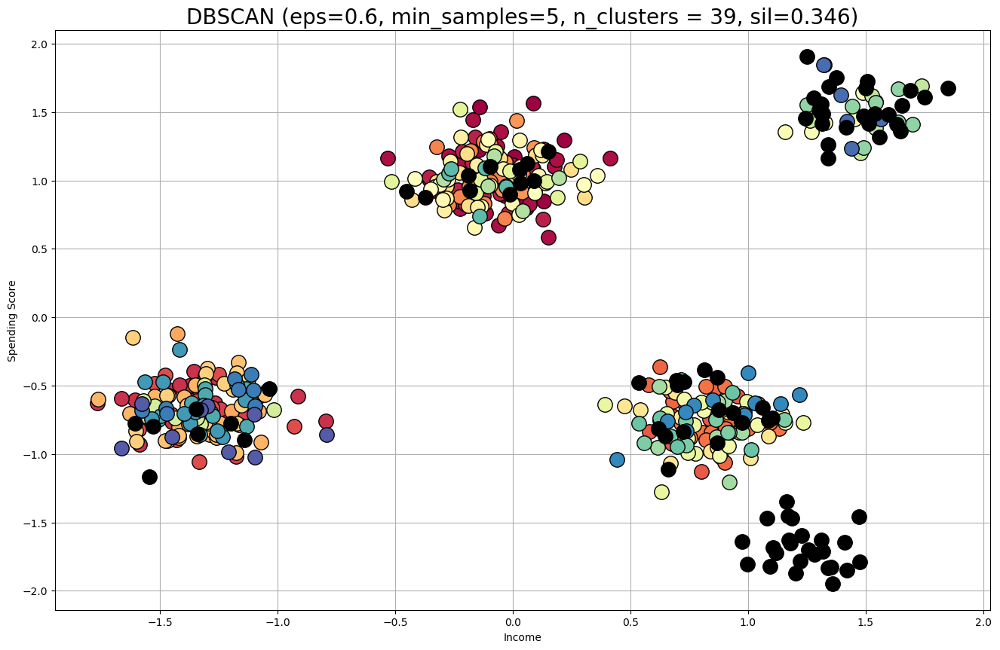

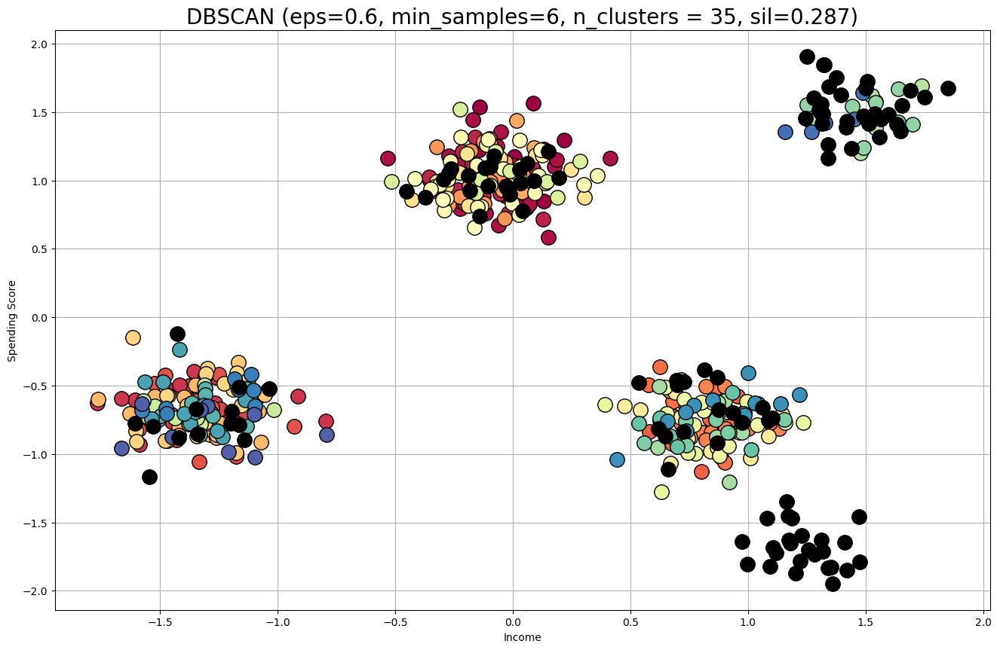

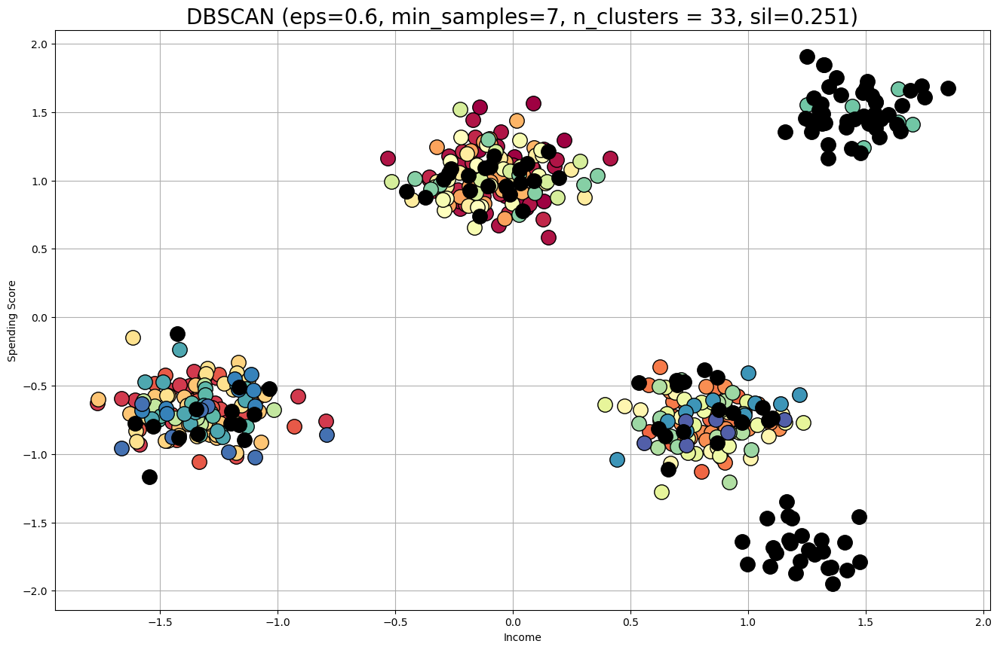

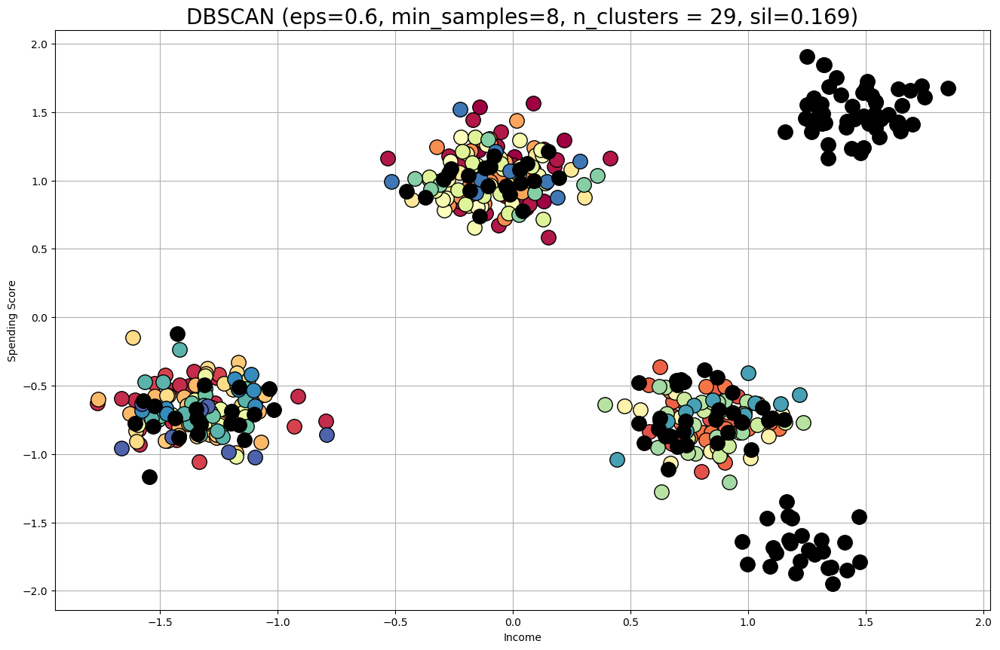

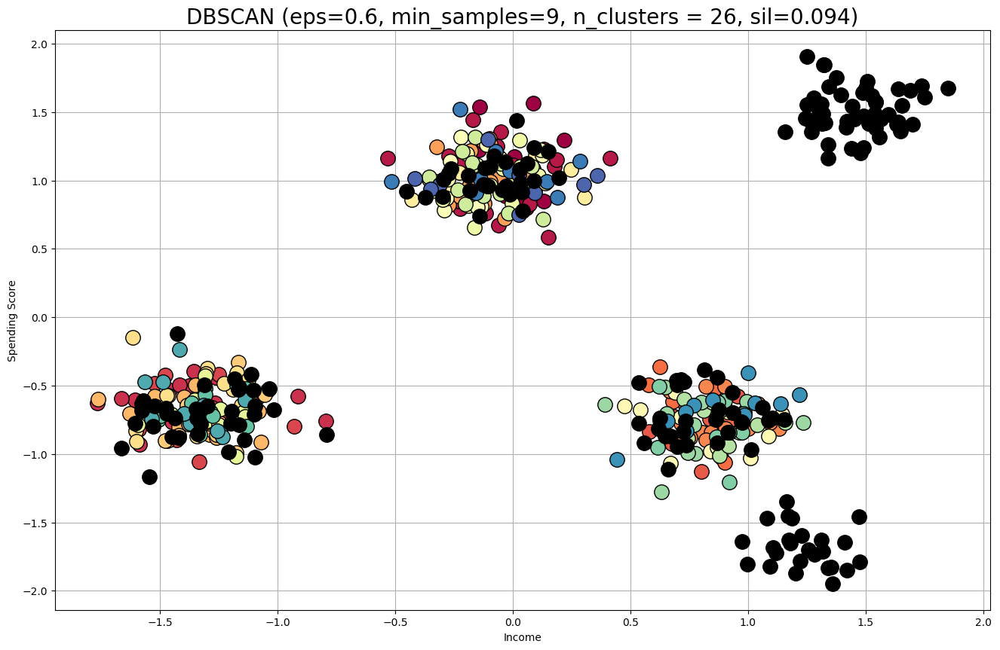

In [22]:
def do_dbscan(data, eps, min_samples):
    db = DBSCAN(eps=eps, min_samples=min_samples).fit(data)

    unique_labels = set(db.labels_)
    n_clusters = len(unique_labels)
    
    if n_clusters <= 1:
        print('eps={}, min_samples={}, n_clusters <= 1. Returning.'.format(eps, min_samples))
        return
    
    sil = silhouette_score(data, db.labels_)
    print("eps={}, min_samples={}, n_clusters={}, sil={}".format(eps, min_samples, n_clusters, sil))
    
    plt.figure(figsize=(16, 10));
    plt.grid(True);   
    
    colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))];

    for k in unique_labels:
        if k == -1:        # Black used for noise.
            col = [0, 0, 0, 1]
        else:
            col = colors[k]

        xy = data[db.labels_ == k]
        plt.plot(xy.iloc[:, 1], xy.iloc[:, 2], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=14);


    plt.title('');
    plt.title("DBSCAN (eps={}, min_samples={}, n_clusters = {:d}, sil={:.3f})".format(eps, min_samples, n_clusters, sil), fontsize=20);
    plt.xlabel('Income', fontsize=10);
    plt.ylabel('Spending Score', fontsize=10);
    plt.xticks(fontsize=10);
    plt.yticks(fontsize=10);
    

epss = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6]
min_samples = range(1, 10)

for prod in list(itertools.product(epss, min_samples)):
    do_dbscan(data, prod[0], prod[1])


## Hierarchical (Agglomerative) Clustering

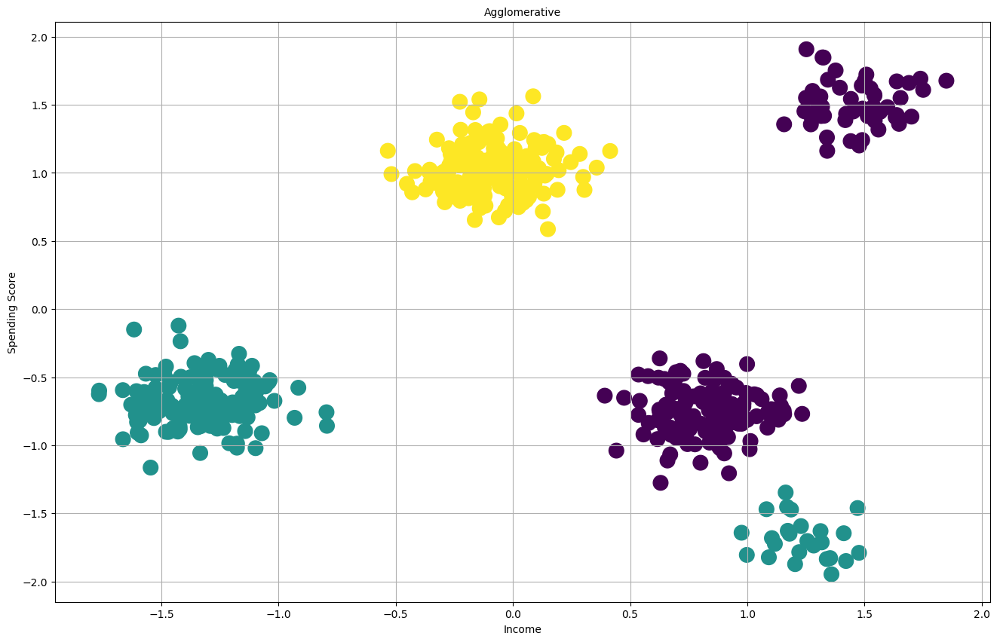

In [24]:
agg = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
agg.fit(data)

agg.labels_
silhouette_score(data, agg.labels_)

plt.style.use('default');

plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(data.iloc[:, 1], data.iloc[:, 2], s=200, c=agg.labels_);
plt.title("Agglomerative", fontsize=10);
plt.xlabel('Income', fontsize=10);
plt.ylabel('Spending Score', fontsize=10);
plt.xticks(fontsize=10);
plt.yticks(fontsize=10);


##### Adding a column that indicates which cluster each point falls into

In [25]:
new['aggcluster'] = agg.fit_predict(data)
new.cluster.value_counts()

0    176
1    172
2    157
Name: cluster, dtype: int64

## Dendograms, Linkages, and Distance Metrics

Linkage=complete, Metric=euclidean, Clusters=5, Silhouette=0.573
Linkage=complete, Metric=minkowski, Clusters=5, Silhouette=0.573
Linkage=complete, Metric=cityblock, Clusters=5, Silhouette=0.617
Linkage=complete, Metric=cosine, Clusters=5, Silhouette=0.681
Linkage=complete, Metric=correlation, Clusters=5, Silhouette=0.72
Linkage=complete, Metric=chebyshev, Clusters=5, Silhouette=0.623
Linkage=complete, Metric=canberra, Clusters=5, Silhouette=0.75
Linkage=complete, Metric=mahalanobis, Clusters=5, Silhouette=0.261
Linkage=ward, Metric=euclidean, Clusters=5, Silhouette=0.624
Linkage=single, Metric=euclidean, Clusters=5, Silhouette=0.602
Linkage=single, Metric=minkowski, Clusters=5, Silhouette=0.602


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume t

Linkage=single, Metric=cityblock, Clusters=5, Silhouette=0.663


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=single, Metric=cosine, Clusters=5, Silhouette=0.905


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=single, Metric=correlation, Clusters=5, Silhouette=0.74


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=single, Metric=chebyshev, Clusters=4, Silhouette=0.696


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=single, Metric=canberra, Clusters=5, Silhouette=0.75


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=single, Metric=mahalanobis, Clusters=5, Silhouette=0.553


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=centroid, Metric=euclidean, Clusters=5, Silhouette=0.686


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=average, Metric=euclidean, Clusters=5, Silhouette=0.553


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=average, Metric=minkowski, Clusters=5, Silhouette=0.553


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=average, Metric=cityblock, Clusters=5, Silhouette=0.663


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=average, Metric=cosine, Clusters=5, Silhouette=0.743


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=average, Metric=correlation, Clusters=5, Silhouette=0.916


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=average, Metric=chebyshev, Clusters=5, Silhouette=0.561


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=average, Metric=canberra, Clusters=5, Silhouette=0.75


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=average, Metric=mahalanobis, Clusters=5, Silhouette=0.402


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


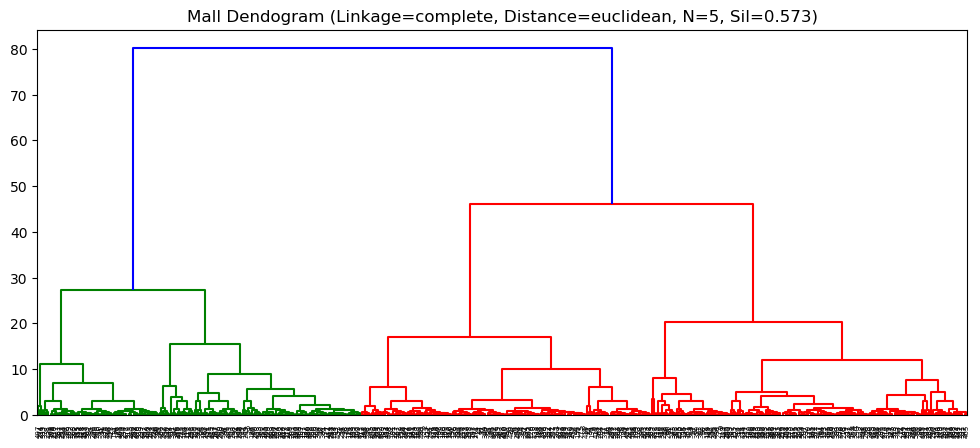

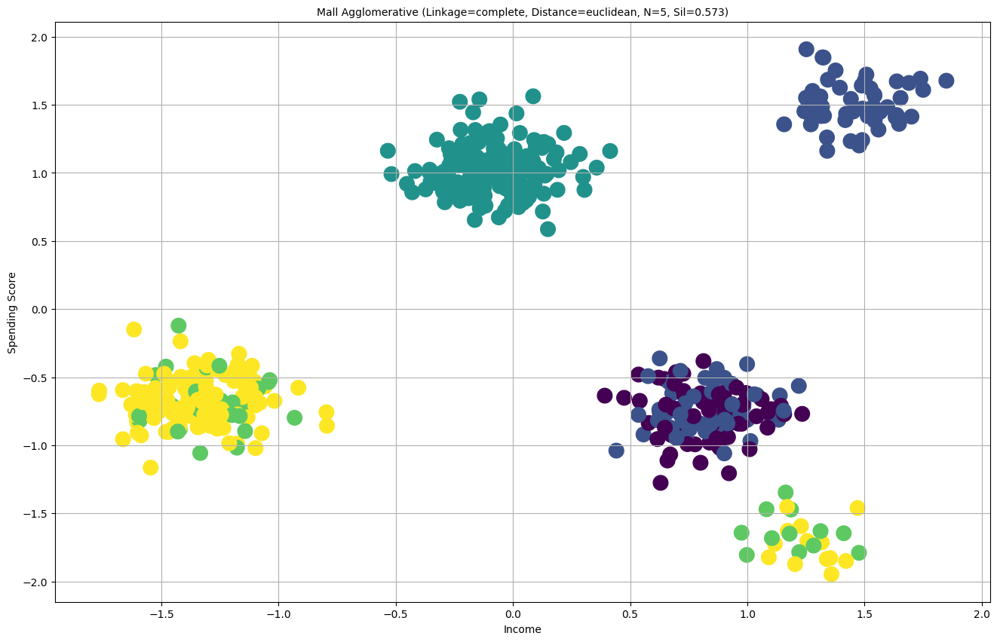

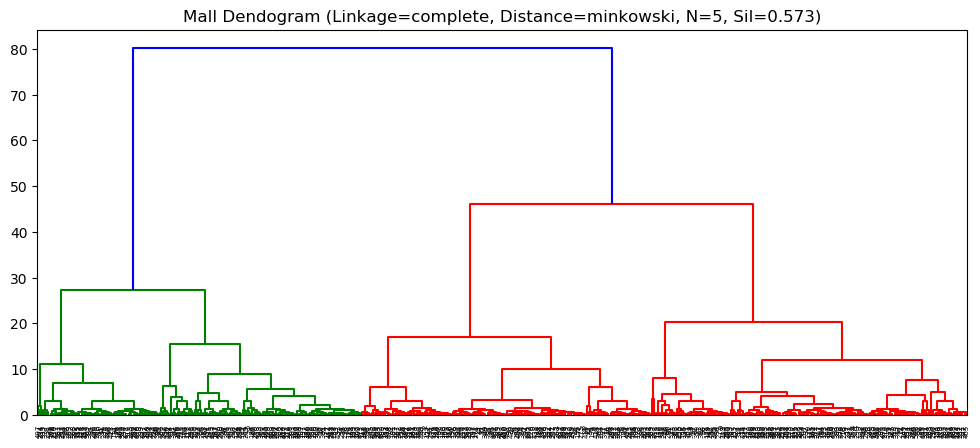

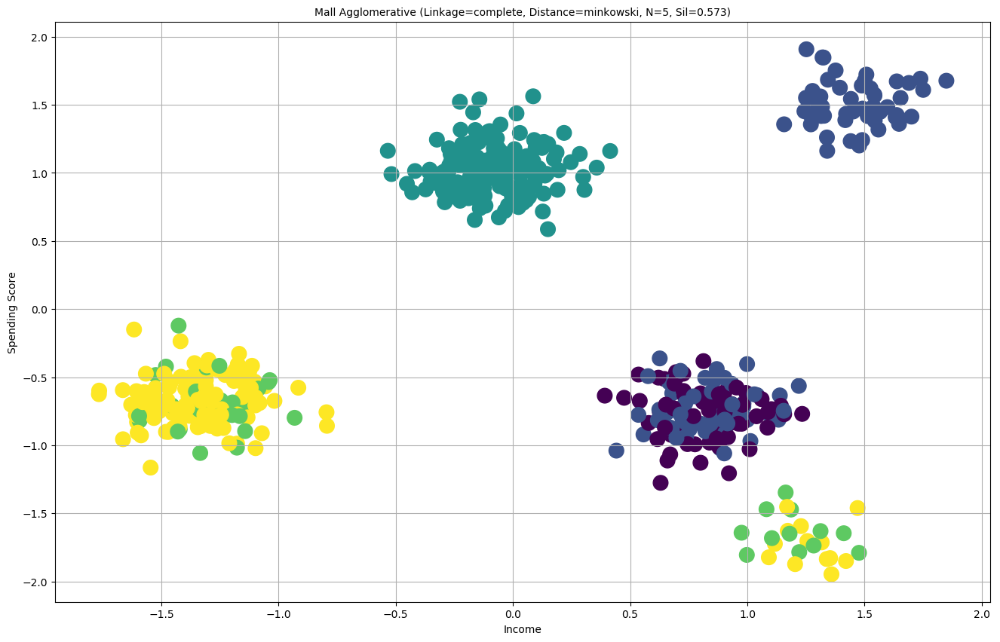

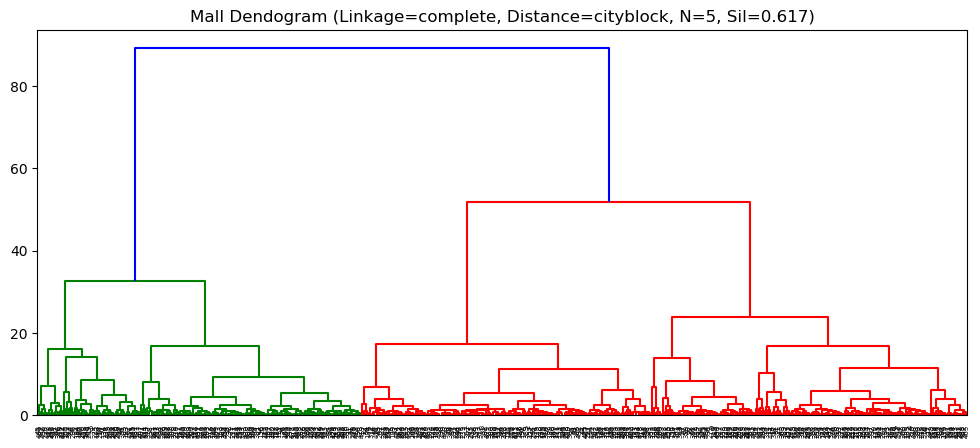

...

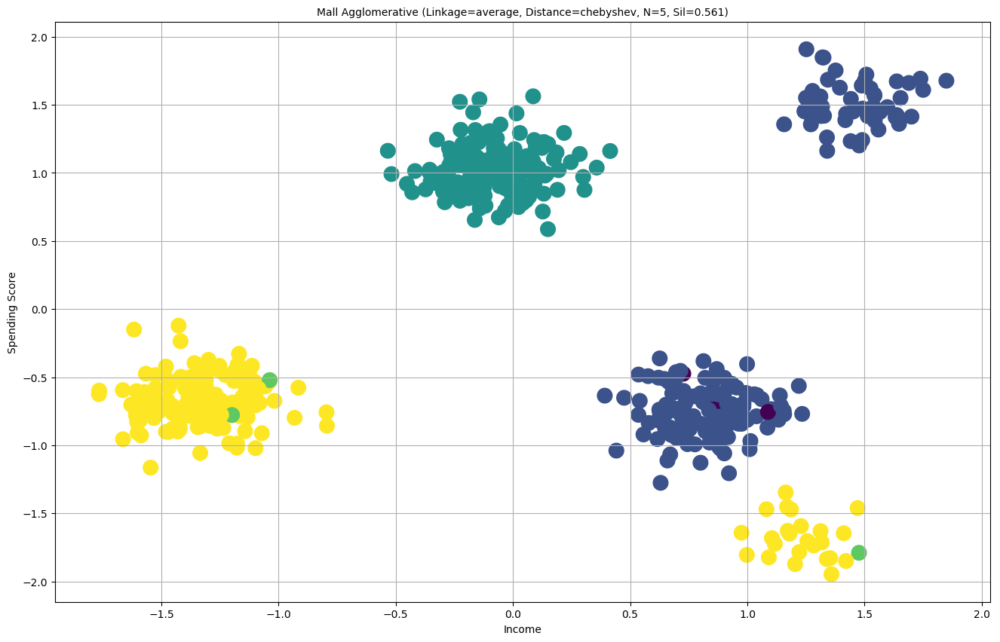

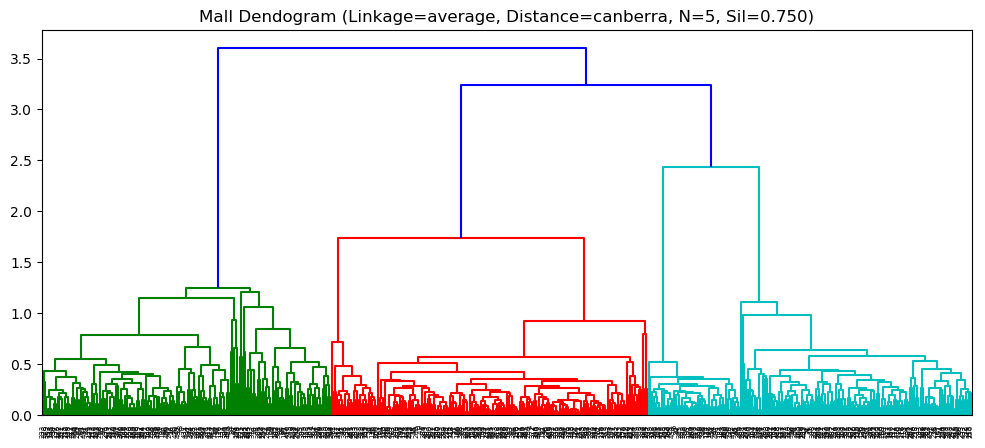

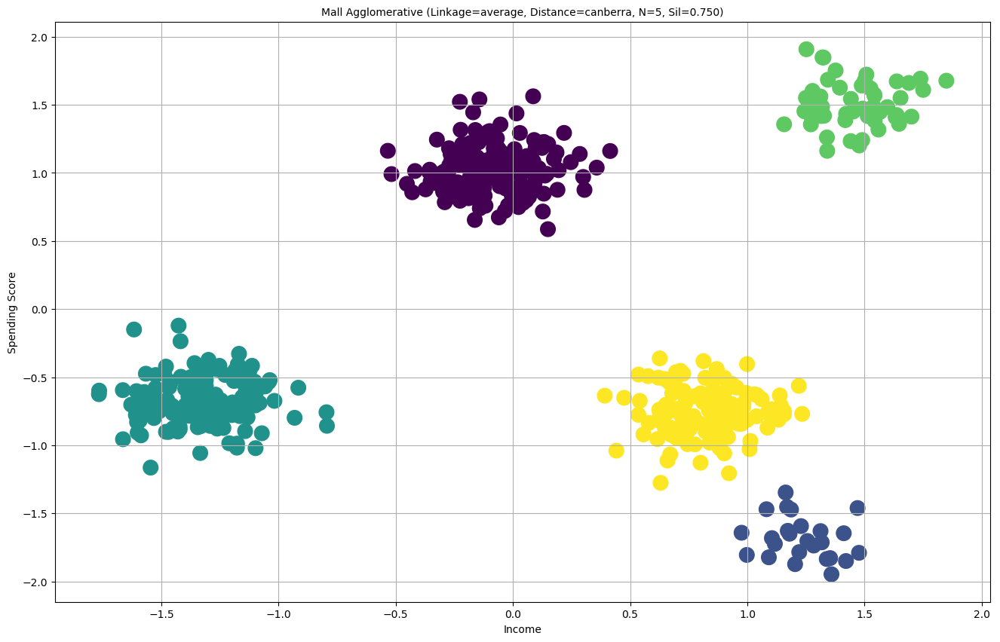

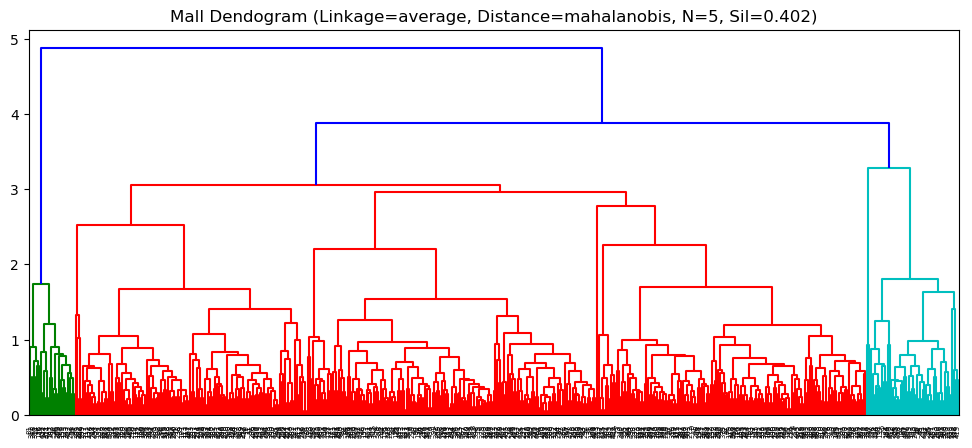

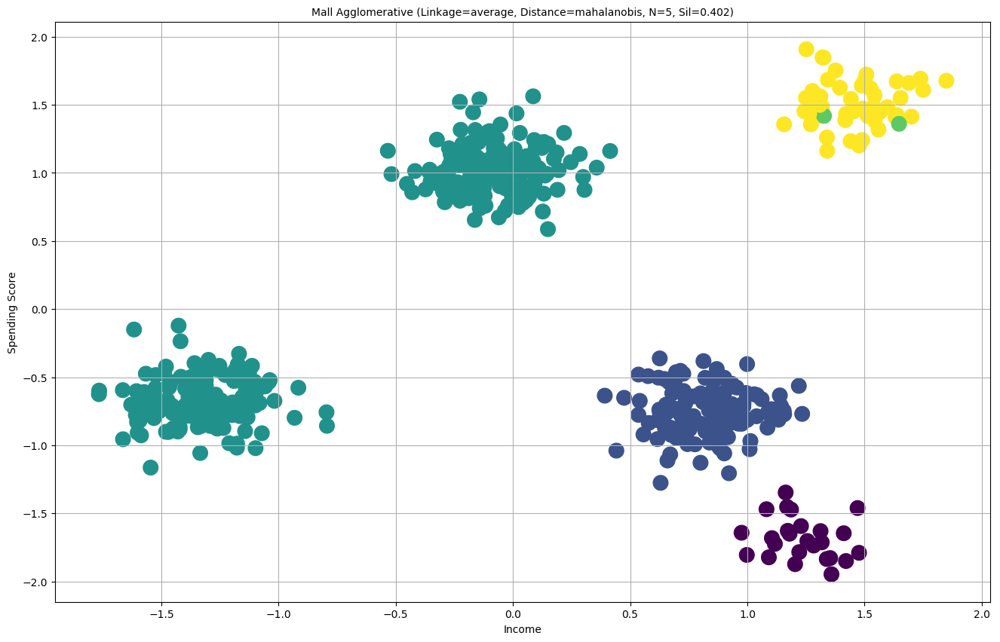

In [26]:
def plot_agg(data, linkage, metric):
    aggl = scipy.cluster.hierarchy.linkage(data, method=linkage, metric=metric)
    
    labels = scipy.cluster.hierarchy.fcluster(aggl, 5, criterion="maxclust")
    
    sil = 0
    n = len(set(labels))
    if n > 1:
        sil = silhouette_score(data , labels, metric=metric)
    print("Linkage={}, Metric={}, Clusters={}, Silhouette={:.3}".format(linkage, metric, n, sil))
    
    # Plot the dendogram
    plt.figure(figsize=(12, 5))  
    plt.title("Mall Dendogram (Linkage={}, Distance={}, N={}, Sil={:.3f})".format(linkage, metric, n, sil))  
    dend = scipy.cluster.hierarchy.dendrogram(aggl) 
    
    
    # Plot the points
    plt.style.use('default');
    plt.figure(figsize=(16, 10));
    plt.grid(True);

    plt.scatter(data.iloc[:, 1], data.iloc[:, 2], s=200, c=labels);
    plt.title("Mall Agglomerative (Linkage={}, Distance={}, N={}, Sil={:.3f})".format(linkage, metric, n, sil), fontsize=10);
    plt.xlabel('Income', fontsize=10);
    plt.ylabel('Spending Score', fontsize=10);
    plt.xticks(fontsize=10);
    plt.yticks(fontsize=10);

    
linkages = ['complete', 'ward', 'single', 'centroid', 'average']
metrics = ['euclidean', 'minkowski', 'cityblock', 'cosine', 'correlation', 'chebyshev', 'canberra', 'mahalanobis']

for prod in list(itertools.product(linkages, metrics)):
    
    # Some combos are not allowed
    if (prod[0] in ['ward', 'centroid']) and prod[1] != 'euclidean':
        continue
        
    plot_agg(data, prod[0], prod[1])

## Gaussian Mixture Model Clustering (GMM)

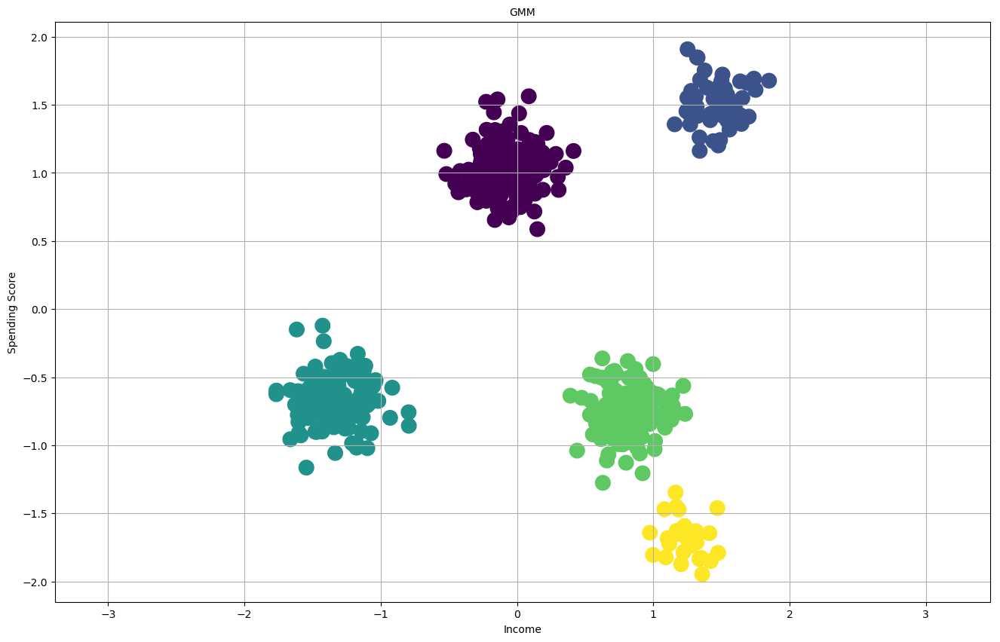

In [27]:
gmm = GaussianMixture(n_components=5, covariance_type='full').fit(data)

labels = gmm.predict(data)
silhouette_score(data, labels)

def make_ellipses(gmm, ax):
    for n, label in enumerate(set(labels)):
        if gmm.covariance_type == 'full':
            covariances = gmm.covariances_[n][:2, :2]
        elif gmm.covariance_type == 'tied':
            covariances = gmm.covariances_[:2, :2]
        elif gmm.covariance_type == 'diag':
            covariances = np.diag(gmm.covariances_[n][:2])
        elif gmm.covariance_type == 'spherical':
            covariances = np.eye(gmm.means_.shape[1]) * gmm.covariances_[n]
        v, w = np.linalg.eigh(covariances)
        u = w[0] / np.linalg.norm(w[0])
        angle = np.arctan2(u[1], u[0])
        angle = 180 * angle / np.pi  # convert to degrees
        v = 2. * np.sqrt(2.) * np.sqrt(v)
        ell = mpl.patches.Ellipse(gmm.means_[n, :2], v[0], v[1],
                                  180 + angle, color='grey')
        ell.set_clip_box(ax.bbox)
        ell.set_alpha(0.2)
        ax.add_artist(ell)
        ax.set_aspect('equal', 'datalim')


plt.style.use('default');

plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(data.iloc[:, 1], data.iloc[:, 2], s=200, c=labels);
make_ellipses(gmm, plt.gca())
plt.title("GMM", fontsize=10);
plt.xlabel('Income', fontsize=10);
plt.ylabel('Spending Score', fontsize=10);
plt.xticks(fontsize=10);
plt.yticks(fontsize=10);